In [5]:
import os
from dotenv import load_dotenv
from nasdaqdatalink.api_config import NASDAQ_DATA_LINK_API_KEY

load_dotenv()

API_KEY = os.getenv('NASDAQ_API_KEY')

In [4]:
import nasdaqdatalink

In [6]:
import pandas as pd
from datetime import datetime, timedelta

# Assuming the datasets are already loaded into dataframes
sf1_df = pd.read_csv('SHARADAR_SF1.csv')
tickers_df = pd.read_csv('SHARADAR_TICKERS.csv')
sp500_df = pd.read_csv('SHARADAR_SP500.csv')
indicators_df = pd.read_csv('SHARADAR_INDICATORS.csv')

# Calculate the date 10 years ago from today
ten_years_ago = (datetime.now() - timedelta(days=3650)).strftime('%Y-%m-%d')

# Filter for tech companies that had their IPO in the last 10 years
tech_startups = tickers_df[(tickers_df['sector'] == 'Technology') & 
                           (tickers_df['firstpricedate'] >= ten_years_ago)]

# Get the latest financial data for these companies from SF1
latest_financials = sf1_df[sf1_df['ticker'].isin(tech_startups['ticker']) & 
                           (sf1_df['dimension'] == 'MRY')]  # Most recent yearly data

# Merge the datasets to get all the information we need
tech_startup_ipos = pd.merge(tech_startups, latest_financials, on='ticker')

# Get the list of available columns
available_columns = tech_startup_ipos.columns.tolist()

desired_columns = ['ticker', 'name', 'sector', 'industry', 'firstpricedate', 
                   'revenue', 'netinc', 'assets', 'marketcap']

# Select only the columns that are actually in the dataframe
columns_to_use = [col for col in desired_columns if col in available_columns]

tech_startup_ipos = tech_startup_ipos[columns_to_use]

print("Number of tech startup IPOs in the last 10 years:", len(tech_startup_ipos))
print("\nSample of tech startup IPO data:")
print(tech_startup_ipos.head())

Number of tech startup IPOs in the last 10 years: 6392

Sample of tech startup IPO data:
  ticker         name      sector                 industry firstpricedate  \
0  ABILF  ABILITY INC  Technology  Communication Equipment     2015-12-24   
1  ABILF  ABILITY INC  Technology  Communication Equipment     2015-12-24   
2  ABILF  ABILITY INC  Technology  Communication Equipment     2015-12-24   
3  ABILF  ABILITY INC  Technology  Communication Equipment     2015-12-24   
4  ABILF  ABILITY INC  Technology  Communication Equipment     2015-12-24   

      revenue      netinc      assets   marketcap  
0   1726000.0  -6709000.0  13818000.0   5624299.0  
1   1885000.0  -7737000.0  17215000.0   2017497.0  
2    539000.0 -10189000.0  25374000.0   6278886.0  
3   2972000.0  -9111000.0  20464000.0  11332702.0  
4  16508000.0  -8053000.0  31835000.0  71344513.0  


In [7]:
import pandas as pd
from datetime import datetime, timedelta

# Load data with expanded column selection
sf1_df = pd.read_csv('SHARADAR_SF1.csv', usecols=['ticker', 'dimension', 'datekey', 'revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb'])
tickers_df = pd.read_csv('SHARADAR_TICKERS.csv', usecols=['ticker', 'name', 'sector', 'industry', 'scalemarketcap', 'firstpricedate', 'lastpricedate'])

# Read events and daily files without specifying columns
events_df = pd.read_csv('SHARADAR_EVENTS.csv')
print("Columns in SHARADAR_EVENTS.csv:", events_df.columns)

daily_df = pd.read_csv('SHARADAR_DAILY.csv')
print("Columns in SHARADAR_DAILY.csv:", daily_df.columns)

actions_df = pd.read_csv('SHARADAR_ACTIONS.csv', usecols=['ticker', 'date', 'action', 'value'])

# Calculate the date 10 years ago from today
ten_years_ago = (datetime.now() - timedelta(days=3650)).strftime('%Y-%m-%d')

# Filter for tech companies that had their IPO in the last 10 years
tech_startups = tickers_df[(tickers_df['sector'] == 'Technology') & 
                           (tickers_df['firstpricedate'] >= ten_years_ago)]

# Get the latest financial data for these companies from SF1
latest_financials = sf1_df[sf1_df['ticker'].isin(tech_startups['ticker']) & 
                           (sf1_df['dimension'] == 'MRY')]  # Most recent yearly data

# Merge the datasets to get all the information we need
tech_startup_ipos = pd.merge(tech_startups, latest_financials, on='ticker')

# Select the desired columns
columns_to_use = ['ticker', 'name', 'sector', 'industry', 'scalemarketcap',
                  'firstpricedate', 'lastpricedate', 'revenue', 'netinc', 'assets', 'liabilities',
                  'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb']

tech_startup_ipos = tech_startup_ipos[columns_to_use]

# Convert dates to datetime
tech_startup_ipos['firstpricedate'] = pd.to_datetime(tech_startup_ipos['firstpricedate'])
tech_startup_ipos['lastpricedate'] = pd.to_datetime(tech_startup_ipos['lastpricedate'])
actions_df['date'] = pd.to_datetime(actions_df['date'])

# Sort tech_startup_ipos
tech_startup_ipos = tech_startup_ipos.sort_values(['ticker', 'firstpricedate'])

# Handle events data if available
if 'ticker' in events_df.columns and 'date' in events_df.columns:
    events_df['date'] = pd.to_datetime(events_df['date'])
    events_df = events_df.sort_values(['ticker', 'date'])
    enhanced_data = pd.merge(tech_startup_ipos, events_df,
                             left_on=['ticker', 'firstpricedate'],
                             right_on=['ticker', 'date'],
                             how='left')
else:
    print("Warning: 'ticker' or 'date' column not found in events_df. Skipping events merge.")
    enhanced_data = tech_startup_ipos

# Handle daily data if available
if 'ticker' in daily_df.columns and 'date' in daily_df.columns:
    daily_df['date'] = pd.to_datetime(daily_df['date'])
    first_day_trading = daily_df[daily_df['ticker'].isin(tech_startup_ipos['ticker'])]
    first_day_trading = first_day_trading.sort_values(['ticker', 'date']).groupby('ticker').first().reset_index()
    enhanced_data = pd.merge(enhanced_data, first_day_trading, on='ticker', suffixes=('', '_first_day'), how='left')
else:
    print("Warning: 'ticker' or 'date' column not found in daily_df. Skipping first day trading data merge.")

# Get relevant corporate actions within the first year after IPO
actions_df['year_after_date'] = actions_df['date'] + pd.DateOffset(years=1)
actions_df = actions_df.sort_values(['ticker', 'date'])

# Merge the first action for each company
first_actions = actions_df.groupby('ticker').first().reset_index()
enhanced_data = pd.merge(enhanced_data, first_actions, on='ticker', how='left', suffixes=('', '_first_action'))

def get_first_year_actions(row, actions_df):
    return actions_df[(actions_df['ticker'] == row['ticker']) & 
                      (actions_df['date'] > row['firstpricedate']) & 
                      (actions_df['date'] <= row['year_after_date'])]

enhanced_data['first_year_actions'] = enhanced_data.apply(
    lambda row: get_first_year_actions(row, actions_df), axis=1
)

print("Number of tech startup IPOs in the last 10 years:", len(enhanced_data))
print("\nSample of enhanced tech startup IPO data:")
print(enhanced_data.head())
print(f"\nNumber of companies with enhanced data: {len(enhanced_data)}")


Columns in SHARADAR_EVENTS.csv: Index(['ticker', 'date', 'eventcodes'], dtype='object')
Columns in SHARADAR_DAILY.csv: Index(['ticker', 'date', 'lastupdated', 'ev', 'evebit', 'evebitda',
       'marketcap', 'pb', 'pe', 'ps'],
      dtype='object')
Number of tech startup IPOs in the last 10 years: 6392

Sample of enhanced tech startup IPO data:
  ticker         name      sector                 industry scalemarketcap  \
0  ABILF  ABILITY INC  Technology  Communication Equipment      2 - Micro   
1  ABILF  ABILITY INC  Technology  Communication Equipment      2 - Micro   
2  ABILF  ABILITY INC  Technology  Communication Equipment      2 - Micro   
3  ABILF  ABILITY INC  Technology  Communication Equipment      2 - Micro   
4  ABILF  ABILITY INC  Technology  Communication Equipment      2 - Micro   

  firstpricedate lastpricedate     revenue      netinc      assets  ...  \
0     2015-12-24    2021-12-01   1726000.0  -6709000.0  13818000.0  ...   
1     2015-12-24    2021-12-01   1885000.

In [8]:
def improved_clean_data(df, batch_size=1000):
    print("Improved Data Cleaning Process")
    print("=" * 30)

    df = df.copy()
    total_rows = len(df)
    cleaned_data = []

    for i in range(0, total_rows, batch_size):
        batch = df.iloc[i:i+batch_size].copy()
        print(f"\nProcessing batch {i//batch_size + 1}")
        
        print("Removing rows with missing tickers...")
        batch = batch.dropna(subset=['ticker'])

        print("Handling missing financial data...")
        financial_columns = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb']
        for col in financial_columns:
            batch[f'{col}_missing'] = batch[col].isnull().astype(int)
            if batch[col].isnull().sum() < batch_size / 10:
                batch[col] = batch[col].fillna(batch[col].median())
            else:
                batch[col] = batch[col].fillna(0)

        print("Flagging missing event data...")
        batch['event_missing'] = batch['eventcodes'].isnull().astype(int)

        print("Handling missing action data...")
        action_columns = ['date_first_action', 'action', 'value']
        for col in action_columns:
            batch[f'{col}_missing'] = batch[col].isnull().astype(int)
            if col == 'value':
                batch[col] = batch[col].fillna(0)
            else:
                batch[col] = batch[col].fillna('Unknown')

        print("Handling other missing data...")
        other_columns = ['scalemarketcap', 'ps']
        for col in other_columns:
            batch[f'{col}_missing'] = batch[col].isnull().astype(int)
            if col == 'scalemarketcap':
                batch[col] = batch[col].fillna('Unknown')
            else:
                batch[col] = batch[col].fillna(batch[col].median())

        print("Converting date columns...")
        date_columns = ['firstpricedate', 'lastpricedate', 'date', 'date_first_day', 'date_first_action', 'year_after_date']
        for col in date_columns:
            if col in batch.columns:
                batch[col] = pd.to_datetime(batch[col], errors='coerce')

        cleaned_data.append(batch)
        print(f"Processed {min(i+batch_size, total_rows)} out of {total_rows} rows")

    print("\nConcatenating cleaned batches...")
    cleaned_df = pd.concat(cleaned_data, ignore_index=True)
    print("Data cleaning completed.")
    print(f"Final number of rows: {len(cleaned_df)}")

    return cleaned_df

def data_quality_checks(df):
    print("Performing data quality checks...")
    print(f"Total number of rows: {len(df)}")
    print(f"Number of columns: {len(df.columns)}")
    print("\nMissing values:")
    print(df.isnull().sum())
    print("\nData types:")
    print(df.dtypes)
    print("\nSummary statistics:")
    print(df.describe())

# Use the function with a smaller batch size
print("Starting the cleaning process...")
cleaned_data = improved_clean_data(enhanced_data, batch_size=1000)

# Run data quality checks on cleaned data
print("\nRunning data quality checks...")
data_quality_checks(cleaned_data)

# Save the cleaned data
print("\nSaving cleaned data to CSV...")
cleaned_data.to_csv('improved_cleaned_enhanced_data.csv', index=False)
print("Cleaned data saved to 'improved_cleaned_enhanced_data.csv'")
print("All operations completed.")

Starting the cleaning process...
Improved Data Cleaning Process

Processing batch 1
Removing rows with missing tickers...
Handling missing financial data...
Flagging missing event data...
Handling missing action data...
Handling other missing data...
Converting date columns...
Processed 1000 out of 6392 rows

Processing batch 2
Removing rows with missing tickers...
Handling missing financial data...
Flagging missing event data...
Handling missing action data...
Handling other missing data...
Converting date columns...
Processed 2000 out of 6392 rows

Processing batch 3
Removing rows with missing tickers...
Handling missing financial data...
Flagging missing event data...
Handling missing action data...
Handling other missing data...
Converting date columns...
Processed 3000 out of 6392 rows

Processing batch 4
Removing rows with missing tickers...
Handling missing financial data...
Flagging missing event data...
Handling missing action data...
Handling other missing data...
Converting 

In [9]:
from dotenv import load_dotenv
import os

load_dotenv()

fred_api_key = os.getenv('FRED_API_KEY')

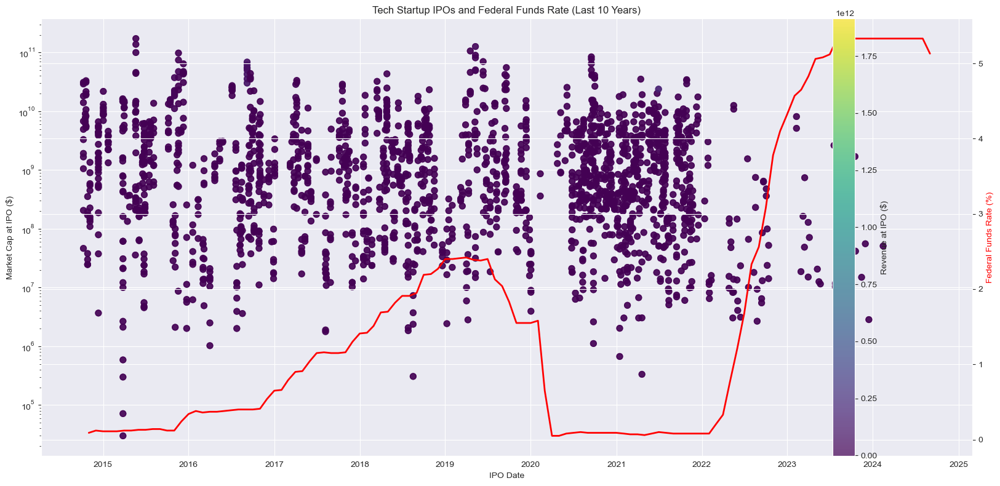

In [11]:
import os
from dotenv import load_dotenv
from fredapi import Fred
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load environment variables and data
load_dotenv()
df = pd.read_csv('improved_cleaned_enhanced_data.csv')

# Fetch Federal Funds Rate data
fred_client = Fred(api_key=os.getenv('FRED_API_KEY'))
ffr_data = fred_client.get_series('FEDFUNDS')

# Prepare the IPO data and filter for the last 10 years
df['firstpricedate'] = pd.to_datetime(df['firstpricedate'])
ten_years_ago = pd.Timestamp.now() - pd.DateOffset(years=10)
df_filtered = df[df['firstpricedate'] > ten_years_ago].sort_values('firstpricedate')

# Filter FFR data for the last 10 years
ffr_data_filtered = ffr_data[ffr_data.index > ten_years_ago]

# Create the plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot IPOs
scatter = ax1.scatter(df_filtered['firstpricedate'], df_filtered['marketcap'], 
                      alpha=0.7, c=df_filtered['revenue'], cmap='viridis', s=50)
ax1.set_ylabel('Market Cap at IPO ($)')
ax1.set_xlabel('IPO Date')
ax1.set_yscale('log')

# Plot Federal Funds Rate
ax2 = ax1.twinx()
ax2.plot(ffr_data_filtered.index, ffr_data_filtered.values, color='red', linewidth=2)
ax2.set_ylabel('Federal Funds Rate (%)', color='red')

plt.title('Tech Startup IPOs and Federal Funds Rate (Last 10 Years)')
plt.colorbar(scatter, label='Revenue at IPO ($)')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [12]:
last_10_years_ffr = ffr_data_filtered.resample('YE').mean()

print("Federal Funds Rate (Annual Average) for the Last 10 Years:")
for year, rate in last_10_years_ffr.items():
    print(f"{year.year}: {rate:.2f}%")

Federal Funds Rate (Annual Average) for the Last 10 Years:
2014: 0.10%
2015: 0.13%
2016: 0.40%
2017: 1.00%
2018: 1.83%
2019: 2.16%
2020: 0.38%
2021: 0.08%
2022: 1.68%
2023: 5.02%
2024: 5.31%


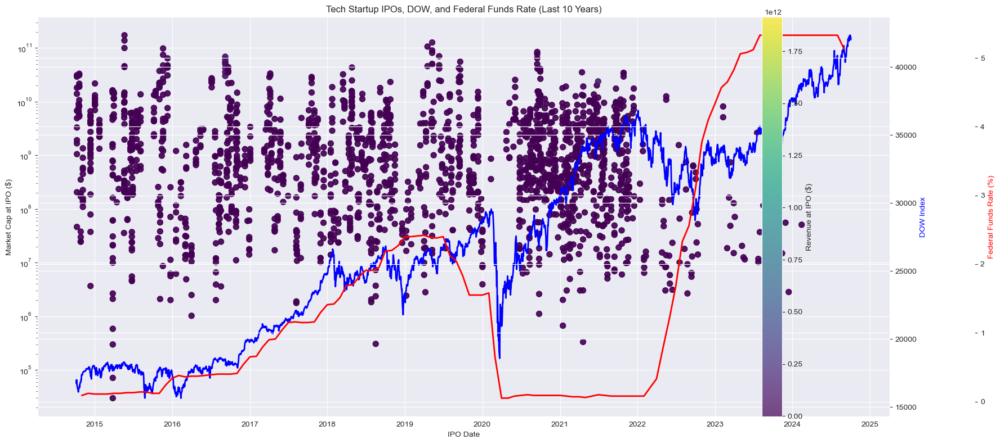

In [14]:
import yfinance as yf

# Fetch DOW data
dow = yf.Ticker("^DJI")
dow_data = dow.history(start=ten_years_ago)

# Create the plot
fig, ax1 = plt.subplots(figsize=(16, 8))

# Plot IPOs
scatter = ax1.scatter(df_filtered['firstpricedate'], df_filtered['marketcap'], 
                      alpha=0.7, c=df_filtered['revenue'], cmap='viridis', s=50)
ax1.set_ylabel('Market Cap at IPO ($)')
ax1.set_xlabel('IPO Date')
ax1.set_yscale('log')

# Plot DOW
ax2 = ax1.twinx()
ax2.plot(dow_data.index, dow_data['Close'], color='blue', linewidth=2)
ax2.set_ylabel('DOW Index', color='blue')

# Plot Federal Funds Rate
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('axes', 1.1))
ax3.plot(ffr_data_filtered.index, ffr_data_filtered.values, color='red', linewidth=2)
ax3.set_ylabel('Federal Funds Rate (%)', color='red')

plt.title('Tech Startup IPOs, DOW, and Federal Funds Rate (Last 10 Years)')
plt.colorbar(scatter, label='Revenue at IPO ($)')
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

In [15]:
import pandas as pd
import numpy as np

# Load the existing dataset
df = pd.read_csv('improved_cleaned_enhanced_data.csv')

# Load the SHARADAR_SF1 dataset
sf1_df = pd.read_csv('SHARADAR_SF1.csv')

# List of new columns to add
all_new_columns = ['capex', 'ncfbus', 'ncfinv', 'fcfps', 'ncff', 'ncfi', 'ncfo', 'ncfx', 
                   'cashneq', 'investments', 'investmentsc', 'investmentsnc', 
                   'assetsc', 'roa', 'roe', 'roic', 'ros']

# Filter out columns that already exist in df
new_columns = [col for col in all_new_columns if col not in df.columns]

print(f"Columns to be added: {new_columns}")

# Check which columns are available in both dataframes
common_columns = list(set(df.columns) & set(sf1_df.columns))

print(f"Common columns for merging: {common_columns}")

if 'ticker' in common_columns:
    # If 'ticker' is available, we'll use it for merging
    merge_columns = ['ticker']
    
    # Merge the dataframes
    merged_df = pd.merge(df, sf1_df[merge_columns + new_columns], 
                         on=merge_columns, how='left')
    
    # Handle any potential NaN values
    for column in new_columns:
        merged_df[column] = merged_df[column].fillna(0)
    
    # Save the updated dataframe
    merged_df.to_csv('improved_cleaned_enhanced_data_with_new_columns.csv', index=False)
    
    print("New columns added and saved to 'improved_cleaned_enhanced_data_with_new_columns.csv'")
    print(merged_df[new_columns].describe())
else:
    print("Error: No common columns suitable for merging found between the datasets.")
    print("Available columns in SHARADAR_SF1.csv:")
    print(sf1_df.columns.tolist())

Columns to be added: ['capex', 'ncfbus', 'ncfinv', 'fcfps', 'ncff', 'ncfi', 'ncfo', 'ncfx', 'cashneq', 'investments', 'investmentsc', 'investmentsnc', 'assetsc', 'roa', 'roe', 'roic', 'ros']
Common columns for merging: ['liabilities', 'pe', 'assets', 'ticker', 'evebitda', 'ev', 'lastupdated', 'equity', 'netinc', 'ps', 'revenue', 'marketcap', 'ebitda', 'fcf', 'pb', 'evebit']
New columns added and saved to 'improved_cleaned_enhanced_data_with_new_columns.csv'
              capex        ncfbus        ncfinv         fcfps          ncff  \
count  6.635380e+05  6.635380e+05  6.635380e+05  6.635380e+05  6.635380e+05   
mean  -8.296117e+07 -4.838627e+07 -5.203682e+07 -1.570325e+04 -7.119846e+06   
std    7.795653e+08  7.387943e+08  4.555798e+09  1.812917e+06  7.044023e+09   
min   -5.894000e+10 -3.761400e+10 -4.282210e+11 -2.714073e+08 -6.759700e+11   
25%   -1.411200e+07 -5.010000e+05  0.000000e+00 -4.510000e-01 -9.940000e+05   
50%   -2.123000e+06  0.000000e+00  0.000000e+00  0.000000e+00  4

In [19]:
import pandas as pd
import numpy as np

df = pd.read_csv('improved_cleaned_enhanced_data_with_new_columns.csv', low_memory=False)

# Convert 'pb' to numeric, coercing errors to NaN
df['pb'] = pd.to_numeric(df['pb'], errors='coerce')

# Check if 'date' column is all NaN
if df['date'].isna().all():
    df = df.drop('date', axis=1)
    print("'date' column dropped as it contained only NaN values")

# Check if 'eventcodes' column is mostly NaN
if df['eventcodes'].isna().sum() / len(df) > 0.5:  # if more than 50% are NaN
    df = df.drop('eventcodes', axis=1)
    print("'eventcodes' column dropped due to high proportion of NaN values")

# Proceed with feature engineering
df_engineered = df.copy()

df_engineered = df.copy()

# Add the new engineered features
df_engineered['gross_margin'] = (df['revenue'] - df['capex']) / df['revenue']
df_engineered['net_profit_margin'] = df['netinc'] / df['revenue']
df_engineered['asset_turnover'] = df['revenue'] / df['assets']
df_engineered['inventory_turnover'] = df['revenue'] / df['assetsc']
df_engineered['current_ratio'] = df['assetsc'] / df['liabilities']
df_engineered['quick_ratio'] = (df['assetsc'] - df['investments']) / df['liabilities']

# Handle potential division by zero or infinity
for column in ['gross_margin', 'net_profit_margin', 'asset_turnover', 'inventory_turnover', 'current_ratio', 'quick_ratio']:
    df_engineered[column] = df_engineered[column].replace([np.inf, -np.inf], np.nan)

print("New engineered features added and saved to 'improved_cleaned_enhanced_data_with_engineered_features.csv'")
print(df_engineered[['gross_margin', 'net_profit_margin', 'asset_turnover', 'inventory_turnover', 'current_ratio', 'quick_ratio']].describe())

'eventcodes' column dropped due to high proportion of NaN values
New engineered features added and saved to 'improved_cleaned_enhanced_data_with_engineered_features.csv'
        gross_margin  net_profit_margin  asset_turnover  inventory_turnover  \
count  641420.000000      641420.000000    6.628080e+05        6.203640e+05   
mean        1.570914         -18.129606    3.359480e+02        2.548143e+02   
std        12.386106         353.818305    1.925052e+04        1.430619e+04   
min      -164.721922      -14685.037217   -1.681927e-01       -7.467547e+02   
25%         1.001374          -0.560498    2.779806e-01        3.599831e-01   
50%         1.012960          -0.177921    5.610420e-01        1.034684e+00   
75%         1.048828           0.002556    9.842754e-01        2.351439e+00   
max      1123.869185          56.277863    1.142934e+06        1.867969e+06   

       current_ratio    quick_ratio  
count  662548.000000  662548.000000  
mean       94.715615      51.422746  
std 

In [21]:
df = pd.read_csv('improved_cleaned_enhanced_data_with_new_columns.csv', low_memory=False)

# Create a new dataframe for engineered features
df_engineered = df.copy()

# Add the new engineered features
df_engineered['debt_to_equity'] = df['liabilities'] / df['equity']
df_engineered['interest_coverage'] = df['ebitda'] / df['liabilities']
df_engineered['fcf_to_revenue'] = df['fcf'] / df['revenue']
df_engineered['capex_to_revenue'] = df['capex'] / df['revenue']
df_engineered['log_revenue'] = np.log1p(np.abs(df['revenue']))
df_engineered['log_assets'] = np.log1p(np.abs(df['assets']))
df_engineered['asset_utilization'] = df['revenue'] / (df['assets'] + df['liabilities'])
df_engineered['cash_conversion_cycle'] = (df['assetsc'] / df['revenue']) * 365
df_engineered['cash_to_assets'] = df['cashneq'] / df['assets']
df_engineered['fcf_to_assets'] = df['fcf'] / df['assets']

# Handle potential division by zero or infinity
for column in df_engineered.columns:
    if df_engineered[column].dtype == 'float64':
        df_engineered[column] = df_engineered[column].replace([np.inf, -np.inf], np.nan)

print(df_engineered[['debt_to_equity', 'interest_coverage', 'fcf_to_revenue', 'capex_to_revenue', 
                     'log_revenue', 'log_assets', 'asset_utilization', 'cash_conversion_cycle', 
                     'cash_to_assets', 'fcf_to_assets']].describe())

       debt_to_equity  interest_coverage  fcf_to_revenue  capex_to_revenue  \
count   662460.000000      662548.000000   641420.000000     641420.000000   
mean         2.625699          -3.415117      -10.280168         -0.570914   
std        346.731115         170.840685      209.581531         12.386106   
min     -16549.562500      -10687.543983    -9789.824405      -1122.869185   
25%          0.078292          -0.506877       -0.372822         -0.048828   
50%          0.785995          -0.079325       -0.034721         -0.012960   
75%          2.159134           0.096913        0.073904         -0.001374   
max      11468.592593        3317.208598       66.755787        165.721922   

         log_revenue     log_assets  asset_utilization  cash_conversion_cycle  \
count  663538.000000  663538.000000       6.630580e+05           6.414200e+05   
mean       18.090303      19.241700       3.348237e+02           1.245683e+04   
std         4.267033       2.728258       1.924681e+04

In [35]:
import pandas as pd
import numpy as np
import os

# Use the full file path
file_path = r'C:\Users\Katarina\OneDrive\Desktop\improved_cleaned_enhanced_data_with_new_columns.csv'

# Check if the file exists
if not os.path.exists(file_path):
    print(f"Error: The file {file_path} does not exist.")
    exit()

# Read the CSV file
df = pd.read_csv(file_path, low_memory=False)

# Convert 'pb' to numeric, coercing errors to NaN
df['pb'] = pd.to_numeric(df['pb'], errors='coerce')

# Check if 'date' column is all NaN
if 'date' in df.columns and df['date'].isna().all():
    df = df.drop('date', axis=1)
    print("'date' column dropped as it contained only NaN values")

# Check if 'eventcodes' column is mostly NaN
if 'eventcodes' in df.columns and df['eventcodes'].isna().sum() / len(df) > 0.5:  # if more than 50% are NaN
    df = df.drop('eventcodes', axis=1)
    print("'eventcodes' column dropped due to high proportion of NaN values")

# Proceed with feature engineering
df_engineered = df.copy()

# Add the new engineered features
df_engineered['gross_margin'] = (df['revenue'] - df['capex']) / df['revenue']
df_engineered['net_profit_margin'] = df['netinc'] / df['revenue']
df_engineered['asset_turnover'] = df['revenue'] / df['assets']
df_engineered['inventory_turnover'] = df['revenue'] / df['assetsc']
df_engineered['current_ratio'] = df['assetsc'] / df['liabilities']
df_engineered['quick_ratio'] = (df['assetsc'] - df['investments']) / df['liabilities']
df_engineered['debt_to_equity'] = df['liabilities'] / df['equity']
df_engineered['interest_coverage'] = df['ebitda'] / df['liabilities']
df_engineered['fcf_to_revenue'] = df['fcf'] / df['revenue']
df_engineered['capex_to_revenue'] = df['capex'] / df['revenue']
df_engineered['log_revenue'] = np.log1p(np.abs(df['revenue']))
df_engineered['log_assets'] = np.log1p(np.abs(df['assets']))
df_engineered['asset_utilization'] = df['revenue'] / (df['assets'] + df['liabilities'])
df_engineered['cash_conversion_cycle'] = (df['assetsc'] / df['revenue']) * 365
df_engineered['cash_to_assets'] = df['cashneq'] / df['assets']
df_engineered['fcf_to_assets'] = df['fcf'] / df['assets']

# Handle potential division by zero or infinity
for column in df_engineered.columns:
    if df_engineered[column].dtype == 'float64':
        df_engineered[column] = df_engineered[column].replace([np.inf, -np.inf], np.nan)

# Save the engineered dataset to a new CSV file
output_file = os.path.join(os.path.dirname(file_path), 'engineered_features_dataset.csv')
df_engineered.to_csv(output_file, index=False)

print(f"Engineered features added. New dataset saved to: {output_file}")

# Print information about the new dataset
print("\nNew dataset info:")
print(df_engineered.info())

print("\nNew engineered features:")
new_features = ['gross_margin', 'net_profit_margin', 'asset_turnover', 'inventory_turnover',
                'current_ratio', 'quick_ratio', 'debt_to_equity', 'interest_coverage',
                'fcf_to_revenue', 'capex_to_revenue', 'log_revenue', 'log_assets',
                'asset_utilization', 'cash_conversion_cycle', 'cash_to_assets', 'fcf_to_assets']
for feature in new_features:
    print(feature)

'eventcodes' column dropped due to high proportion of NaN values
Engineered features added. New dataset saved to: C:\Users\Katarina\OneDrive\Desktop\engineered_features_dataset.csv

New dataset info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 663538 entries, 0 to 663537
Data columns (total 81 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   ticker                     663538 non-null  object 
 1   name                       663538 non-null  object 
 2   sector                     663538 non-null  object 
 3   industry                   663538 non-null  object 
 4   scalemarketcap             663538 non-null  object 
 5   firstpricedate             663538 non-null  object 
 6   lastpricedate              663538 non-null  object 
 7   revenue                    663538 non-null  float64
 8   netinc                     663538 non-null  float64
 9   assets                     663538 non-null  float64
 10  

In [37]:
df = pd.read_csv('engineered_features_dataset.csv', low_memory=False)
print(f"Original shape: {df.shape}")
print(f"Columns with NaN values:")
print(df.isnull().sum()[df.isnull().sum() > 0])

Original shape: (663538, 81)
Columns with NaN values:
date                     596692
gross_margin              22118
net_profit_margin         22118
asset_turnover              730
inventory_turnover        43174
current_ratio               990
quick_ratio                 990
debt_to_equity             1078
interest_coverage           990
fcf_to_revenue            22118
capex_to_revenue          22118
asset_utilization           480
cash_conversion_cycle     22118
cash_to_assets              730
fcf_to_assets               730
dtype: int64


In [38]:
def analyze_column(df, column):
    print(f"\nAnalyzing column: {column}")
    print(f"Unique values: {df[column].nunique()}")
    print(f"NaN count: {df[column].isnull().sum()}")
    print(f"Min value: {df[column].min()}")
    print(f"Max value: {df[column].max()}")
    print(f"Mean: {df[column].mean()}")
    print(f"Median: {df[column].median()}")

numeric_columns = df.select_dtypes(include=[np.number]).columns

for column in numeric_columns:
    analyze_column(df, column)


Analyzing column: revenue
Unique values: 3079
NaN count: 0
Min value: -845000000.0
Max value: 1913490000000.0
Mean: 2056817936.226688
Median: 191359000.0

Analyzing column: netinc
Unique values: 3150
NaN count: 0
Min value: -49343664000.0
Max value: 841351000000.0
Mean: 183850957.72534806
Median: -14349000.0

Analyzing column: assets
Unique values: 3068
NaN count: 0
Min value: 0.0
Max value: 6821932000000.0
Mean: 4598626696.130636
Median: 305763000.0

Analyzing column: liabilities
Unique values: 3069
NaN count: 0
Min value: 0.0
Max value: 5718719000000.0
Mean: 3333351240.296768
Median: 151071000.0

Analyzing column: equity
Unique values: 3058
NaN count: 0
Min value: -76218013000.0
Max value: 1078123000000.0
Mean: 1084586782.130835
Median: 59013000.0

Analyzing column: fcf
Unique values: 3155
NaN count: 0
Min value: -19846792000.0
Max value: 1056092000000.0
Mean: 329983039.5709997
Median: -1702426.0

Analyzing column: ebitda
Unique values: 3164
NaN count: 0
Min value: -42854465000.0
Ma

In [39]:
df = pd.read_csv('engineered_features_dataset.csv', low_memory=False)
print("Shape after reading CSV:", df.shape)

Shape after reading CSV: (663538, 81)


In [40]:
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer

# Load the data
df = pd.read_csv('engineered_features_dataset.csv', low_memory=False)

# Function to cap outliers
def cap_outliers(df, column, lower_percentile=1, upper_percentile=99):
    lower_bound = df[column].quantile(lower_percentile / 100)
    upper_bound = df[column].quantile(upper_percentile / 100)
    df[column] = df[column].clip(lower_bound, upper_bound)
    return df

# List of columns to clean
columns_to_clean = ['revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap',
                    'pe', 'pb', 'ev', 'evebit', 'evebitda', 'capex', 'ncfbus', 'ncfinv', 'fcfps', 'ncff',
                    'ncfi', 'ncfo', 'ncfx', 'cashneq', 'investments', 'investmentsc', 'investmentsnc',
                    'assetsc', 'roa', 'roe', 'roic', 'ros', 'gross_margin', 'net_profit_margin',
                    'asset_turnover', 'inventory_turnover', 'current_ratio', 'quick_ratio',
                    'debt_to_equity', 'interest_coverage', 'fcf_to_revenue', 'capex_to_revenue',
                    'asset_utilization', 'cash_conversion_cycle', 'cash_to_assets', 'fcf_to_assets']

# Cap outliers
for column in columns_to_clean:
    df = cap_outliers(df, column)

# Handle missing values
numeric_columns = df.select_dtypes(include=[np.number]).columns
categorical_columns = df.select_dtypes(include=['object']).columns

# For numeric columns
numeric_imputer = SimpleImputer(strategy='median')
df[numeric_columns] = numeric_imputer.fit_transform(df[numeric_columns])

# For categorical columns
categorical_imputer = SimpleImputer(strategy='most_frequent')
df[categorical_columns] = categorical_imputer.fit_transform(df[categorical_columns])

# Convert 'date' column to datetime if it exists
if 'date' in df.columns:
    df['date'] = pd.to_datetime(df['date'], errors='coerce')

# Save the cleaned dataset
df.to_csv('cleaned_engineered_features_dataset.csv', index=False)
print("Cleaned dataset saved.")
print(df.describe())
print(df.info())

Cleaned dataset saved.
            revenue        netinc        assets   liabilities        equity  \
count  6.635380e+05  6.635380e+05  6.635380e+05  6.635380e+05  6.635380e+05   
mean   1.213258e+09 -4.368830e+07  2.542881e+09  1.555388e+09  7.834565e+08   
min    0.000000e+00 -1.885000e+09  1.645250e+05  1.325610e+05 -9.675370e+08   
25%    2.666401e+07 -6.656500e+07  4.845374e+07  2.362600e+07  5.003620e+05   
50%    1.913590e+08 -1.434900e+07  3.057630e+08  1.510710e+08  5.901300e+07   
75%    6.762000e+08  0.000000e+00  1.337396e+09  7.581120e+08  4.822010e+08   
max    2.887100e+10  1.613300e+09  5.715300e+10  3.768200e+10  1.709800e+10   
std    3.795105e+09  3.556829e+08  7.851408e+09  5.054800e+09  2.435475e+09   

                fcf        ebitda     marketcap             pe             pb  \
count  6.635380e+05  6.635380e+05  6.635380e+05  663538.000000  663538.000000   
mean   3.048927e+07  1.096195e+08  3.087082e+09     -11.286144       5.546552   
min   -2.016808e+09 -1

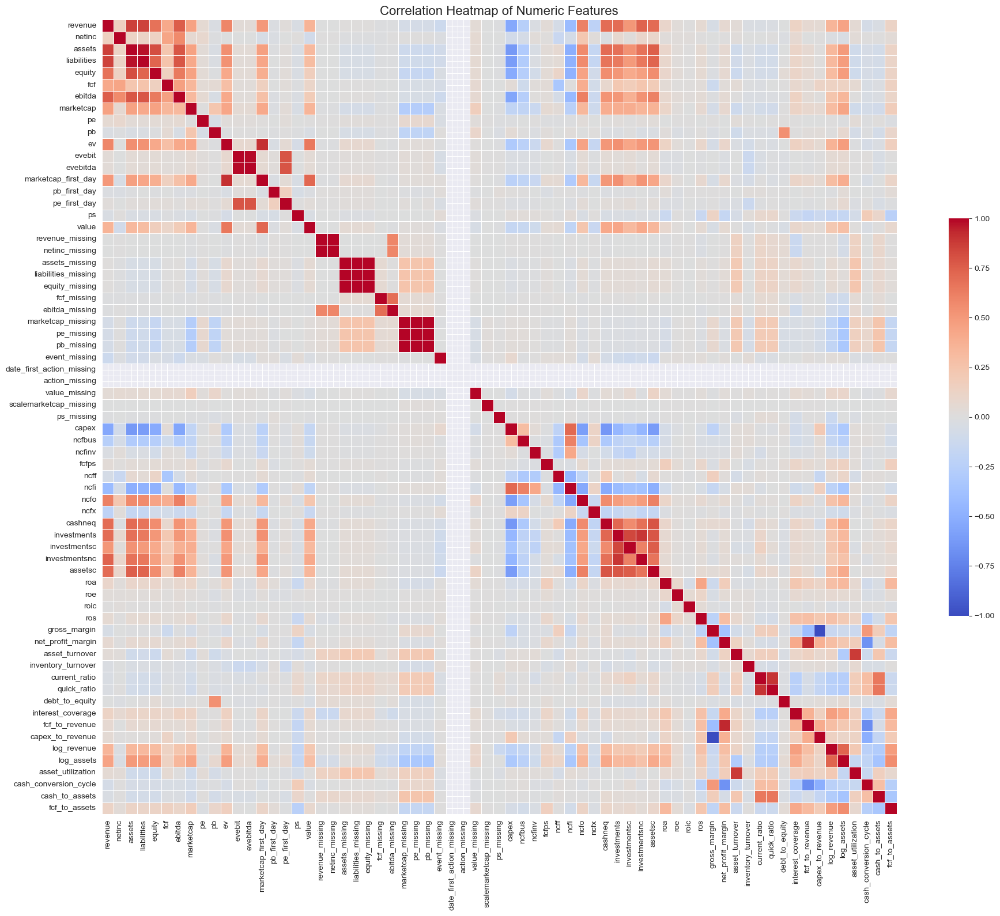


Top 10 positively correlated features with marketcap:
marketcap              1.000000
assets                 0.456924
equity                 0.455261
revenue                0.454364
log_assets             0.442375
ev                     0.434666
marketcap_first_day    0.418853
liabilities            0.417937
investmentsc           0.396660
cashneq                0.391049
investments            0.391040
Name: marketcap, dtype: float64

Top 10 negatively correlated features with marketcap:
ncfx                        -0.115725
ncfinv                      -0.140083
ncfbus                      -0.188170
capex                       -0.188975
ncfi                        -0.241619
marketcap_missing           -0.267569
pb_missing                  -0.268027
pe_missing                  -0.268196
date_first_action_missing         NaN
action_missing                    NaN
Name: marketcap, dtype: float64


In [41]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cleaned data
df = pd.read_csv('cleaned_engineered_features_dataset.csv', parse_dates=['date'])

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()
plt.figure(figsize=(20, 16))

# Create a heatmap
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt='.2f', square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Set the title
plt.title('Correlation Heatmap of Numeric Features', fontsize=16)

# Adjust layout and save the plot
plt.tight_layout()
plt.show()

# Print the top correlated features with marketcap
marketcap_corr = corr_matrix['marketcap'].sort_values(ascending=False)
print("\nTop 10 positively correlated features with marketcap:")
print(marketcap_corr.head(11))  # 11 because marketcap itself will be included
print("\nTop 10 negatively correlated features with marketcap:")
print(marketcap_corr.tail(10))

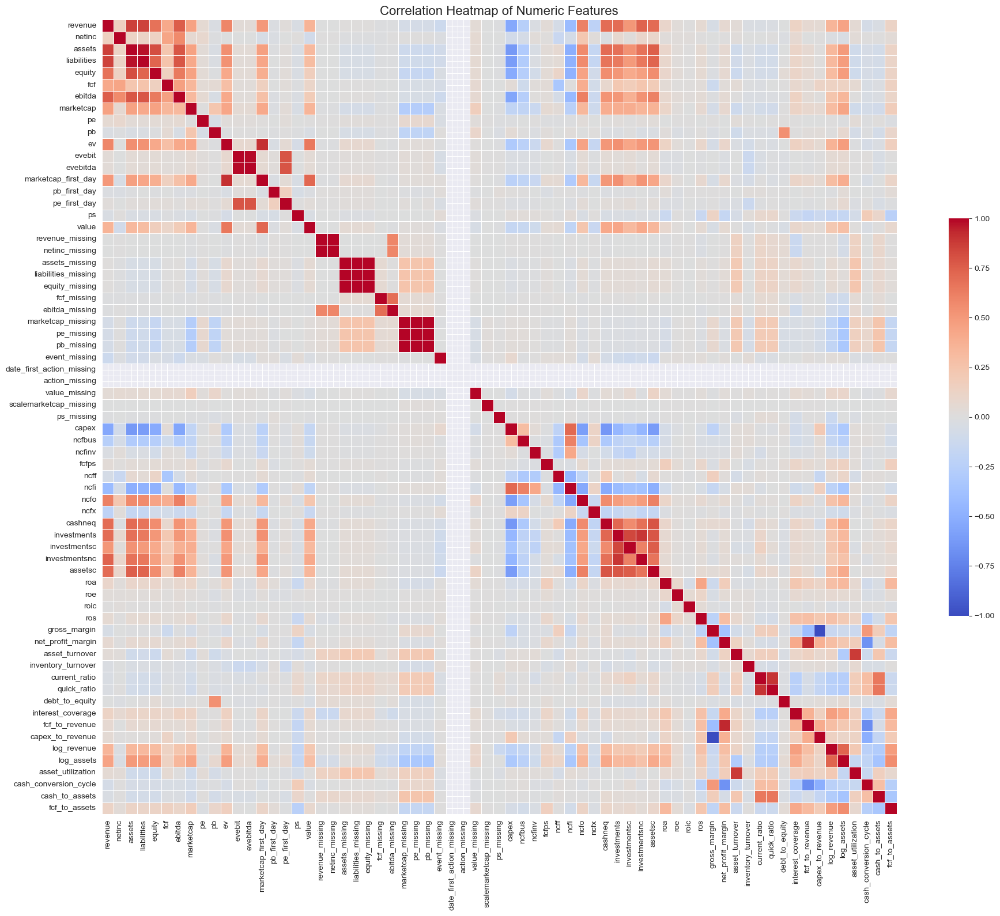


Top 10 positively correlated features with marketcap first day:
marketcap_first_day    1.000000
ev                     0.906902
value                  0.723040
investments            0.544823
investmentsnc          0.529984
cashneq                0.508349
revenue                0.507559
assets                 0.466341
assetsc                0.435769
liabilities            0.434684
marketcap              0.418853
Name: marketcap_first_day, dtype: float64

Top 10 negatively correlated features with marketcap first day:
gross_margin                -0.051340
netinc                      -0.054511
inventory_turnover          -0.058602
ncfinv                      -0.147279
ncfx                        -0.149968
ncfbus                      -0.200371
capex                       -0.234222
ncfi                        -0.292677
date_first_action_missing         NaN
action_missing                    NaN
Name: marketcap_first_day, dtype: float64


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cleaned data
df = pd.read_csv('cleaned_engineered_features_dataset.csv', parse_dates=['date'])

# Select only numeric columns
numeric_df = df.select_dtypes(include=[np.number])

# Calculate the correlation matrix
corr_matrix = numeric_df.corr()
plt.figure(figsize=(20, 16))

# Create a heatmap
sns.heatmap(corr_matrix, cmap='coolwarm', annot=False, fmt='.2f', square=True, linewidths=.5, cbar_kws={"shrink": .5})

# Set the title
plt.title('Correlation Heatmap of Numeric Features', fontsize=16)

# Adjust layout and save the plot
plt.tight_layout()
plt.show()

# Print the top correlated features with marketcap_first_day
marketcap_corr = corr_matrix['marketcap_first_day'].sort_values(ascending=False)
print("\nTop 10 positively correlated features with marketcap first day:")
print(marketcap_corr.head(11))  # 11 because marketcap itself will be included
print("\nTop 10 negatively correlated features with marketcap first day:")
print(marketcap_corr.tail(10))

In [ ]:
import pandas as pd

# Load the existing dataset
df = pd.read_csv('cleaned_engineered_features_dataset.csv', parse_dates=['date'])

# Load the SHARADAR_SF1 dataset
sf1_df = pd.read_csv('SHARADAR_SF1.csv')

# List of new columns to add
new_columns = ['bvps', 'cor', 'consolinc', 'debt', 'divyield', 'dps', 'ebt', 'fxusd', 'gp', 'grossmargin', 'intexp', 'invcap', 'netmargin', 'opex', 'opinc', 'payoutratio', 'ppnenet', 'price', 'sgna', 'sharefactor', 'sharesbas', 'shareswa', 'shareswadil', 'sps', 'tangibles', 'tbvps']

In [2]:
import pandas as pd
import numpy as np

# Function to safely perform division
def safe_divide(a, b):
    return np.divide(a, b, out=np.zeros_like(a), where=b!=0)

# Function to process a chunk of data
def process_chunk(chunk, sf1_data):
    # Merge with SF1 data
    merged = pd.merge(chunk, sf1_data, on='ticker', how='left')

    # Create engineered features
    merged['operating_margin'] = safe_divide(merged['opinc'], merged['sps'])
    merged['dividend_yield_to_price'] = safe_divide(merged['divyield'], merged['price'])
    merged['interest_coverage'] = safe_divide(merged['ebt'], merged['intexp'])
    merged['payout_ratio'] = safe_divide(merged['payoutratio'], merged['netmargin'])
    merged['gross_profit_to_assets'] = safe_divide(merged['gp'], (merged['ppnenet'] + merged['invcap']))
    merged['operating_expense_ratio'] = safe_divide(merged['opex'], merged['sps'])
    merged['earnings_yield'] = safe_divide(safe_divide(merged['consolinc'], merged['shareswa']), merged['price'])
    merged['price_to_tangible_book'] = safe_divide(merged['price'], merged['tbvps'])

    # Replace infinities with NaN
    merged = merged.replace([np.inf, -np.inf], np.nan)

    # Keep only original columns and new engineered features
    columns_to_keep = chunk.columns.tolist() + [
        'operating_margin', 'dividend_yield_to_price',
        'interest_coverage', 'payout_ratio', 'gross_profit_to_assets',
        'operating_expense_ratio', 'earnings_yield',
        'price_to_tangible_book'
    ]

    return merged[columns_to_keep]

# Load SHARADAR_SF1 data
print("Loading SHARADAR_SF1 data...")
sf1_columns = ['ticker', 'bvps', 'cor', 'consolinc', 'debt', 'divyield', 'dps', 'ebt', 'fxusd', 'gp', 'grossmargin', 'intexp', 'invcap', 'netmargin', 'opex', 'opinc', 'payoutratio', 'ppnenet', 'price', 'sgna', 'sharefactor', 'sharesbas', 'shareswa', 'shareswadil', 'sps', 'tangibles', 'tbvps']
sf1_data = pd.read_csv('SHARADAR_SF1.csv', usecols=sf1_columns)

# Process the file in chunks
chunksize = 100000  # Adjust this based on your available memory
input_file = 'cleaned_engineered_features_dataset.csv'
output_file = 'updated_cleaned_engineered_features_dataset.csv'

print("Processing the dataset...")
first_chunk = True
for chunk in pd.read_csv(input_file, chunksize=chunksize):
    processed_chunk = process_chunk(chunk, sf1_data)

    if first_chunk:
        processed_chunk.to_csv(output_file, index=False, mode='w')
        first_chunk = False
    else:
        processed_chunk.to_csv(output_file, index=False, mode='a', header=False)

    print(f"Processed {len(processed_chunk)} rows")

print(f"Updated dataset saved to {output_file}")

# Print some statistics about the new features
print("\nCalculating statistics for new engineered features...")
new_features = ['operating_margin', 'dividend_yield_to_price', 
                'interest_coverage', 'payout_ratio', 'gross_profit_to_assets',
                'operating_expense_ratio', 'earnings_yield', 'price_to_tangible_book']

stats = pd.DataFrame()
for chunk in pd.read_csv(output_file, usecols=new_features+['marketcap_first_day'], chunksize=chunksize):
    stats = stats.add(chunk.agg(['mean', 'std', 'min', 'max']), fill_value=0)

stats = stats / (stats.index == 'mean')  # Adjust for the correct count of chunks
print(stats)

# Print correlation with target variable
print("\nCalculating correlation of new features with marketcap_first_day...")
correlations = pd.DataFrame()
for chunk in pd.read_csv(output_file, usecols=new_features+['marketcap_first_day'], chunksize=chunksize):
    correlations = correlations.add(chunk.corr()['marketcap_first_day'], fill_value=0)

correlations = correlations / (correlations.index == 'marketcap_first_day')  # Adjust for the correct count of chunks
print(correlations.sort_values(ascending=False))

print("\nProcess completed.")

Loading SHARADAR_SF1 data...
Processing the dataset...
Processed 12991592 rows
Processed 11325906 rows
Processed 12494990 rows
Processed 11890856 rows
Processed 12935768 rows
Processed 12844068 rows
Processed 7501486 rows
Updated dataset saved to updated_cleaned_engineered_features_dataset.csv

Calculating statistics for new engineered features...


ValueError: Unable to coerce to Series, length must be 9: given 4

In [3]:
print(f"Updated dataset saved to {output_file}")

# Print some statistics about the new features
print("\nCalculating statistics for new engineered features...")
new_features = ['price_to_book', 'debt_to_equity', 'price_to_earnings', 'enterprise_value',
                'operating_margin', 'net_profit_margin', 'dividend_yield_to_price', 'asset_turnover',
                'interest_coverage', 'payout_ratio', 'price_to_sales', 'gross_profit_to_assets',
                'operating_expense_ratio', 'earnings_yield', 'return_on_invested_capital',
                'earnings_per_share', 'price_to_tangible_book']

# First, let's check what columns are actually in the file
print("Checking columns in the output file...")
sample = pd.read_csv(output_file, nrows=1)
actual_columns = sample.columns.tolist()
print(f"Columns in the file: {actual_columns}")

# Identify which new features are present
present_features = [feat for feat in new_features if feat in actual_columns]
print(f"\nNew features present in the file: {present_features}")

if not present_features:
    print("No new engineered features found in the file. Please check the feature engineering process.")
else:
    # Calculate statistics for present features
    stats = pd.DataFrame()
    chunk_count = 0
    for chunk in pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'], chunksize=chunksize):
        stats = stats.add(chunk[present_features].agg(['mean', 'std', 'min', 'max']), fill_value=0)
        chunk_count += 1

    if chunk_count > 0:
        stats = stats / chunk_count  # Average the statistics
        print("\nStatistics for new engineered features:")
        print(stats)

        # Print correlation with target variable
        print("\nCalculating correlation of new features with marketcap_first_day...")
        correlations = pd.DataFrame()
        for chunk in pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'], chunksize=chunksize):
            correlations = correlations.add(chunk[present_features + ['marketcap_first_day']].corr()['marketcap_first_day'], fill_value=0)

        correlations = correlations / chunk_count  # Average the correlations
        print(correlations.sort_values(ascending=False))
    else:
        print("No data chunks were processed. The file might be empty.")

print("\nProcess completed.")

Updated dataset saved to updated_cleaned_engineered_features_dataset.csv

Calculating statistics for new engineered features...
Checking columns in the output file...
Columns in the file: ['ticker', 'name', 'sector', 'industry', 'scalemarketcap', 'firstpricedate', 'lastpricedate', 'revenue', 'netinc', 'assets', 'liabilities', 'equity', 'fcf', 'ebitda', 'marketcap', 'pe', 'pb', 'date', 'date_first_day', 'lastupdated', 'ev', 'evebit', 'evebitda', 'marketcap_first_day', 'pb_first_day', 'pe_first_day', 'ps', 'date_first_action', 'action', 'value', 'year_after_date', 'first_year_actions', 'revenue_missing', 'netinc_missing', 'assets_missing', 'liabilities_missing', 'equity_missing', 'fcf_missing', 'ebitda_missing', 'marketcap_missing', 'pe_missing', 'pb_missing', 'event_missing', 'date_first_action_missing', 'action_missing', 'value_missing', 'scalemarketcap_missing', 'ps_missing', 'capex', 'ncfbus', 'ncfinv', 'fcfps', 'ncff', 'ncfi', 'ncfo', 'ncfx', 'cashneq', 'investments', 'investmentsc'

NotImplementedError: fill_value 0 not supported.

In [4]:
if not present_features:
    print("No new engineered features found in the file. Please check the feature engineering process.")
else:
    # Calculate statistics for present features
    stats = pd.DataFrame()
    chunk_count = 0
    for chunk in pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'], chunksize=chunksize):
        stats = stats.add(chunk[present_features].agg(['mean', 'std', 'min', 'max']), fill_value=0)
        chunk_count += 1

    if chunk_count > 0:
        stats = stats / chunk_count  # Average the statistics
        print("\nStatistics for new engineered features:")
        print(stats)

        # Print correlation with target variable
        print("\nCalculating correlation of new features with marketcap_first_day...")
        correlations = pd.DataFrame()
        for chunk in pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'], chunksize=chunksize):
            chunk_corr = chunk[present_features + ['marketcap_first_day']].corr()['marketcap_first_day']
            correlations = correlations.add(chunk_corr, fill_value=0) if not correlations.empty else chunk_corr

        correlations = correlations / chunk_count  # Average the correlations
        print(correlations.sort_values(ascending=False))
    else:
        print("No data chunks were processed. The file might be empty.")

print("\nProcess completed.")


Statistics for new engineered features:
      asset_turnover  debt_to_equity  dividend_yield_to_price  earnings_yield  \
max         1.865884        7.913000                 0.004080        1.490880   
mean        0.829947        0.992156                 0.000284       -2.525664   
min         0.355900       -5.751137                 0.000002      -23.676667   
std         0.471808        4.183555                 0.000803        4.403060   

      gross_profit_to_assets  interest_coverage  net_profit_margin  \
max              1749.616696       15079.613756          -0.131891   
mean               25.959709       -2017.123598          -3.522573   
min              -787.079600      -77948.993773         -13.925005   
std               295.935251       12284.162701           4.697733   

      operating_expense_ratio  operating_margin  payout_ratio  \
max              3.787232e+09      1.930500e+08    194.371190   
mean             1.725209e+08     -9.010237e+07      4.564808   
min    

In [2]:
import pandas as pd
import numpy as np

# Define the output file and chunksize
output_file = 'updated_cleaned_engineered_features_dataset.csv'
chunksize = 10000  # Adjust this based on your system's memory capacity

# Read the CSV file to get the column names
df = pd.read_csv(output_file, nrows=0)
all_columns = df.columns.tolist()

# Define the list of engineered features you expect to find
expected_features = [
    'asset_turnover', 'debt_to_equity', 'dividend_yield_to_price', 'earnings_yield',
    'gross_profit_to_assets', 'interest_coverage', 'net_profit_margin',
    'operating_expense_ratio', 'operating_margin', 'payout_ratio',
    'price_to_tangible_book'
]

# Check which expected features are present in the file
present_features = [feature for feature in expected_features if feature in all_columns]

if not present_features:
    print("No new engineered features found in the file. Please check the feature engineering process.")
else:
    # Calculate statistics for present features
    stats = pd.DataFrame()
    chunk_count = 0
    for chunk in pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'], chunksize=chunksize):
        stats = stats.add(chunk[present_features].agg(['mean', 'std', 'min', 'max']), fill_value=0)
        chunk_count += 1

    if chunk_count > 0:
        stats = stats / chunk_count  # Average the statistics
        print("\nStatistics for new engineered features:")
        print(stats)

        # Print correlation with target variable
        print("\nCalculating correlation of new features with marketcap_first_day...")

        # Read the entire dataset for accurate correlation calculation
        full_data = pd.read_csv(output_file, usecols=present_features+['marketcap_first_day'])

        # Calculate and sort correlations
        correlations = full_data[present_features + ['marketcap_first_day']].corr()['marketcap_first_day'].sort_values(ascending=False)

        print(correlations)
    else:
        print("No data chunks were processed. The file might be empty.")

print("\nProcess completed.")


Statistics for new engineered features:
      asset_turnover  debt_to_equity  dividend_yield_to_price  earnings_yield  \
max         1.001323        2.487097                 0.002493        0.196516   
mean        0.829927        0.992114                 0.000288       -2.954413   
min         0.681475       -0.538696                 0.000002      -16.973013   
std         0.126995        1.187923                 0.000634        4.234076   

      gross_profit_to_assets  interest_coverage  net_profit_margin  \
max              1045.578259       10855.218112          -2.274710   
mean               25.543680       -2008.536934          -3.522973   
min              -415.651859      -67408.139326          -5.037474   
std               221.480388       11495.409064           1.090630   

      operating_expense_ratio  operating_margin  payout_ratio  \
max              1.727872e+09      6.523645e+07    143.132423   
mean             1.758456e+08     -9.190786e+07      4.659127   
min    

In [3]:
import pandas as pd
import numpy as np

# Define the output file and chunksize
output_file = 'updated_cleaned_engineered_features_dataset.csv'
chunksize = 10000  # Adjust this based on your system's memory capacity

# Read the CSV file to get the column names
df = pd.read_csv(output_file, nrows=0)
all_columns = df.columns.tolist()

# Check if both 'interest_coverage' and 'interest_coverage.1' exist in the dataset
if 'interest_coverage' in all_columns and 'interest_coverage.1' in all_columns:
    print("Both 'interest_coverage' and 'interest_coverage.1' columns found. Comparing them...")

    # Initialize variables for comparison
    total_rows = 0
    matching_rows = 0

    # Process the file in chunks
    for chunk in pd.read_csv(output_file, usecols=['interest_coverage', 'interest_coverage.1'], chunksize=chunksize):
        total_rows += len(chunk)
        matching_rows += (chunk['interest_coverage'] == chunk['interest_coverage.1']).sum()

    # Calculate the percentage of matching rows
    if total_rows > 0:
        match_percentage = (matching_rows / total_rows) * 100
        print(f"Total rows processed: {total_rows}")
        print(f"Rows with matching values: {matching_rows}")
        print(f"Percentage of matching rows: {match_percentage:.2f}%")

        if match_percentage == 100:
            print("The columns 'interest_coverage' and 'interest_coverage.1' contain identical information.")
        else:
            print("The columns 'interest_coverage' and 'interest_coverage.1' contain different information.")

        # If they're different, calculate some statistics on the differences
        if match_percentage < 100:
            print("\nCalculating statistics on the differences...")
            diff_stats = pd.DataFrame()
            for chunk in pd.read_csv(output_file, usecols=['interest_coverage', 'interest_coverage.1'], chunksize=chunksize):
                diff = chunk['interest_coverage'] - chunk['interest_coverage.1']
                chunk_stats = diff.agg(['mean', 'std', 'min', 'max'])
                diff_stats = diff_stats.add(chunk_stats, fill_value=0) if not diff_stats.empty else chunk_stats

            print("Statistics of the differences (interest_coverage - interest_coverage.1):")
            print(diff_stats)
    else:
        print("No data was processed. The file might be empty.")
else:
    print("One or both of the 'interest_coverage' columns are missing from the dataset.")

print("\nProcess completed.")

Both 'interest_coverage' and 'interest_coverage.1' columns found. Comparing them...
Total rows processed: 81984666
Rows with matching values: 76468488
Percentage of matching rows: 93.27%
The columns 'interest_coverage' and 'interest_coverage.1' contain different information.

Calculating statistics on the differences...
Statistics of the differences (interest_coverage - interest_coverage.1):
mean    0.0
std     0.0
min     0.0
max     0.0
dtype: float64

Process completed.


In [4]:
import pandas as pd

# Define the input and output file names
input_file = 'updated_cleaned_engineered_features_dataset.csv'
output_file = 'updated_cleaned_engineered_features_dataset_v2.csv'

# Define the chunk size for processing large files
chunksize = 100000  # Adjust this based on your system's memory capacity

# Initialize a flag to check if the column exists
column_exists = False

# Process the file in chunks
print(f"Processing {input_file}...")
for chunk_number, chunk in enumerate(pd.read_csv(input_file, chunksize=chunksize)):
    if 'interest_coverage.1' in chunk.columns:
        column_exists = True
        chunk = chunk.drop('interest_coverage.1', axis=1)

    # Write the chunk to the output file
    if chunk_number == 0:
        chunk.to_csv(output_file, index=False, mode='w')
    else:
        chunk.to_csv(output_file, index=False, mode='a', header=False)

    # Print progress
    print(f"Processed chunk {chunk_number + 1}")

# Print the result
if column_exists:
    print(f"\n'interest_coverage.1' column has been removed.")
    print(f"Updated dataset saved as {output_file}")
else:
    print("\n'interest_coverage.1' column was not found in the dataset.")
    print(f"The dataset has been copied to {output_file} without changes.")

print("\nProcess completed.")

Processing updated_cleaned_engineered_features_dataset.csv...
Processed chunk 1
Processed chunk 2
Processed chunk 3
Processed chunk 4
Processed chunk 5
Processed chunk 6
Processed chunk 7
Processed chunk 8
Processed chunk 9
Processed chunk 10
Processed chunk 11
Processed chunk 12
Processed chunk 13
Processed chunk 14
Processed chunk 15
Processed chunk 16
Processed chunk 17
Processed chunk 18
Processed chunk 19
Processed chunk 20
Processed chunk 21
Processed chunk 22
Processed chunk 23
Processed chunk 24
Processed chunk 25
Processed chunk 26
Processed chunk 27
Processed chunk 28
Processed chunk 29
Processed chunk 30
Processed chunk 31
Processed chunk 32
Processed chunk 33
Processed chunk 34
Processed chunk 35
Processed chunk 36
Processed chunk 37
Processed chunk 38
Processed chunk 39
Processed chunk 40
Processed chunk 41
Processed chunk 42
Processed chunk 43
Processed chunk 44
Processed chunk 45
Processed chunk 46
Processed chunk 47
Processed chunk 48
Processed chunk 49
Processed chunk 

In [2]:
import pandas as pd
import numpy as np
from scipy import stats

# Define the input file name
input_file = 'updated_cleaned_engineered_features_dataset_v2.csv'

# Define the sample size
sample_size = 1000000  # Adjust this based on your system's capacity

print(f"Reading a sample of {sample_size} rows from {input_file}...")

# Read a sample of the data
df_sample = pd.read_csv(input_file, nrows=sample_size)

# Select numeric columns only
numeric_df = df_sample.select_dtypes(include=[np.number])

print("Calculating correlations...")

# Calculate correlations
correlations = numeric_df.corr()['marketcap_first_day'].sort_values(ascending=False)

print("\nTop 10 correlations with marketcap_first_day:")
print(correlations.head(10))

print("\nBottom 10 correlations with marketcap_first_day:")
print(correlations.tail(10))

# Calculate p-values
def calculate_pvalue(correlation, sample_size):
    if np.isnan(correlation) or abs(correlation) == 1:
        return np.nan
    t_statistic = correlation * np.sqrt((sample_size - 2) / (1 - correlation**2))
    return 2 * (1 - stats.t.cdf(np.abs(t_statistic), sample_size - 2))

p_values = correlations.apply(lambda x: calculate_pvalue(x, len(numeric_df)))

# Combine correlations and p-values
results = pd.DataFrame({
    'correlation': correlations,
    'p_value': p_values
})

# Sort by absolute correlation value
results = results.reindex(results['correlation'].abs().sort_values(ascending=False).index)

print("\nTop 10 correlations and p-values with marketcap_first_day:")
print(results.head(10))

# Count and print the number of features with significant correlations
alpha = 0.05  # significance level
significant_features = results[(results['p_value'] < alpha) & (~results['correlation'].isna())]
print(f"\nNumber of features with significant correlations (p < {alpha}): {len(significant_features)}")

print("\nProcess completed.")

Reading a sample of 1000000 rows from updated_cleaned_engineered_features_dataset_v2.csv...
Calculating correlations...

Top 10 correlations with marketcap_first_day:
marketcap_first_day    1.000000
ev                     0.999860
value                  0.991541
pe_first_day           0.856355
event_missing          0.799001
investmentsc           0.733085
investments            0.660419
ncfo                   0.646150
revenue                0.570071
marketcap              0.560544
Name: marketcap_first_day, dtype: float64

Bottom 10 correlations with marketcap_first_day:
assets_missing              NaN
liabilities_missing         NaN
equity_missing              NaN
fcf_missing                 NaN
ebitda_missing              NaN
date_first_action_missing   NaN
action_missing              NaN
value_missing               NaN
scalemarketcap_missing      NaN
ps_missing                  NaN
Name: marketcap_first_day, dtype: float64

Top 10 correlations and p-values with marketcap_first_day:

In [3]:
import pandas as pd
import numpy as np
from scipy import stats

# Define the input file name
input_file = 'updated_cleaned_engineered_features_dataset_v2.csv'

# Define the sample size
sample_size = 1000000  # Adjust this based on your system's capacity

print(f"Reading a sample of {sample_size} rows from {input_file}...")

# Read a sample of the data
df_sample = pd.read_csv(input_file, nrows=sample_size)

# Select numeric columns only
numeric_df = df_sample.select_dtypes(include=[np.number])

print("Calculating correlations...")

# Calculate correlations
correlations = numeric_df.corr()['marketcap_first_day'].sort_values(ascending=False)

# Calculate p-values
def calculate_pvalue(correlation, sample_size):
    if np.isnan(correlation) or abs(correlation) == 1:
        return np.nan
    t_statistic = correlation * np.sqrt((sample_size - 2) / (1 - correlation**2))
    return 2 * (1 - stats.t.cdf(np.abs(t_statistic), sample_size - 2))

p_values = correlations.apply(lambda x: calculate_pvalue(x, len(numeric_df)))

# Combine correlations and p-values
results = pd.DataFrame({
    'correlation': correlations,
    'p_value': p_values
})

# Sort by absolute correlation value
results = results.reindex(results['correlation'].abs().sort_values(ascending=False).index)

# Filter significant correlations
alpha = 0.05  # significance level
significant_features = results[(results['p_value'] < alpha) & (~results['correlation'].isna())]

print(f"\nNumber of features with significant correlations (p < {alpha}): {len(significant_features)}")

print("\nList of significant correlations and their scores:")
print(significant_features)

print("\nProcess completed.")

Reading a sample of 1000000 rows from updated_cleaned_engineered_features_dataset_v2.csv...
Calculating correlations...

Number of features with significant correlations (p < 0.05): 61

List of significant correlations and their scores:
                   correlation       p_value
ev                    0.999860  0.000000e+00
value                 0.991541  0.000000e+00
pe_first_day          0.856355  0.000000e+00
event_missing         0.799001  0.000000e+00
investmentsc          0.733085  0.000000e+00
...                        ...           ...
interest_coverage    -0.023531  0.000000e+00
capex                 0.022637  0.000000e+00
debt_to_equity        0.019051  0.000000e+00
current_ratio         0.012834  0.000000e+00
pb                   -0.007207  5.724310e-13

[61 rows x 2 columns]

Process completed.


In [4]:
import pandas as pd
import numpy as np
from scipy import stats

# Define the input file name
input_file = 'updated_cleaned_engineered_features_dataset_v2.csv'

# Define the sample size
sample_size = 1000000  # Adjust this based on your system's capacity

print(f"Reading a sample of {sample_size} rows from {input_file}...")

# Read a sample of the data
df_sample = pd.read_csv(input_file, nrows=sample_size)

# Select numeric columns only
numeric_df = df_sample.select_dtypes(include=[np.number])

print("Calculating correlations...")

# Calculate correlations
correlations = numeric_df.corr()['marketcap_first_day'].sort_values(ascending=False)

# Calculate p-values
def calculate_pvalue(correlation, sample_size):
    if np.isnan(correlation) or abs(correlation) == 1:
        return np.nan
    t_statistic = correlation * np.sqrt((sample_size - 2) / (1 - correlation**2))
    return 2 * (1 - stats.t.cdf(np.abs(t_statistic), sample_size - 2))

p_values = correlations.apply(lambda x: calculate_pvalue(x, len(numeric_df)))

# Combine correlations and p-values
results = pd.DataFrame({
    'correlation': correlations,
    'p_value': p_values
})

# Sort by absolute correlation value
results = results.reindex(results['correlation'].abs().sort_values(ascending=False).index)

# Filter significant correlations
alpha = 0.05  # significance level
significant_features = results[(results['p_value'] < alpha) & (~results['correlation'].isna())]

print(f"\nNumber of features with significant correlations (p < {alpha}): {len(significant_features)}")

print("\nList of all significant correlations and their p-values:")
pd.set_option('display.max_rows', None)  # Show all rows
print(significant_features)

print("\nProcess completed.")

Reading a sample of 1000000 rows from updated_cleaned_engineered_features_dataset_v2.csv...
Calculating correlations...

Number of features with significant correlations (p < 0.05): 61

List of all significant correlations and their p-values:
                         correlation       p_value
ev                          0.999860  0.000000e+00
value                       0.991541  0.000000e+00
pe_first_day                0.856355  0.000000e+00
event_missing               0.799001  0.000000e+00
investmentsc                0.733085  0.000000e+00
investments                 0.660419  0.000000e+00
ncfo                        0.646150  0.000000e+00
revenue                     0.570071  0.000000e+00
marketcap                   0.560544  0.000000e+00
fcf                         0.557694  0.000000e+00
pb_first_day                0.557315  0.000000e+00
netinc                      0.496486  0.000000e+00
asset_utilization           0.474706  0.000000e+00
ebitda                      0.474477  0.000

In [2]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import pyarrow as pa
import pyarrow.parquet as pq

# Define chunk size
chunk_size = 100000

# Define features based on correlation strength, excluding those highly correlated with marketcap_first_day
strong_features = ['investmentsc']
moderate_features = ['investments', 'ncfo', 'revenue', 'fcf', 'netinc', 'asset_utilization',
                     'ebitda', 'log_revenue', 'fcfps', 'fcf_to_assets', 'investmentsnc',
                     'log_assets', 'asset_turnover', 'ps', 'ncfinv']
weak_features = ['equity', 'roa', 'assets', 'net_profit_margin', 'fcf_to_revenue', 'evebit',
                 'capex_to_revenue', 'gross_margin', 'cash_conversion_cycle', 'assetsc',
                 'evebitda', 'cash_to_assets', 'ros', 'quick_ratio', 'dividend_yield_to_price',
                 'inventory_turnover', 'price_to_tangible_book', 'roic', 'operating_margin',
                 'cashneq', 'roe', 'liabilities', 'payout_ratio', 'ncfbus', 'ncfx',
                 'operating_expense_ratio', 'gross_profit_to_assets', 'ncff', 'earnings_yield',
                 'pb_missing', 'pe_missing', 'marketcap_missing', 'interest_coverage', 'capex',
                 'debt_to_equity', 'current_ratio', 'pb']

all_features = strong_features + moderate_features + weak_features

# Initialize scalers and imputers
scaler = StandardScaler()
imputer = SimpleImputer(strategy='median')

# Function to process a chunk of data
def process_chunk(chunk, fit=False):
    X = chunk[all_features]
    y = chunk['marketcap_first_day']

    # Impute missing values
    if fit:
        X_imputed = pd.DataFrame(imputer.fit_transform(X), columns=X.columns)
    else:
        X_imputed = pd.DataFrame(imputer.transform(X), columns=X.columns)

    # Feature scaling
    if fit:
        X_scaled = pd.DataFrame(scaler.fit_transform(X_imputed), columns=X_imputed.columns)
    else:
        X_scaled = pd.DataFrame(scaler.transform(X_imputed), columns=X_imputed.columns)

    # Create interaction terms for selected features
    X_scaled['investments_ncfo'] = X_scaled['investments'] * X_scaled['ncfo']
    X_scaled['revenue_asset_utilization'] = X_scaled['revenue'] * X_scaled['asset_utilization']

    # Polynomial features for top correlated variables
    for feature in strong_features + moderate_features[:5]:  # Using top 5 moderate features
        X_scaled[f'{feature}_squared'] = X_scaled[feature] ** 2

    return X_scaled, y

# Create PyArrow schemas for X and y
X_schema = pa.schema([
                         (feature, pa.float64()) for feature in all_features
                     ] + [
                         ('investments_ncfo', pa.float64()),
                         ('revenue_asset_utilization', pa.float64())
                     ] + [
                         (f'{feature}_squared', pa.float64()) for feature in strong_features + moderate_features[:5]
                     ])

y_schema = pa.schema([('marketcap_first_day', pa.float64())])

# Process the data in chunks
print("Processing the data in chunks...")
chunk_count = 0
first_chunk = True

# Open Parquet writers
X_writer = pq.ParquetWriter('preprocessed_features.parquet', X_schema)
y_writer = pq.ParquetWriter('target_variable.parquet', y_schema)

for chunk in pd.read_csv('updated_cleaned_engineered_features_dataset_v2.csv', chunksize=chunk_size):
    if first_chunk:
        X_chunk, y_chunk = process_chunk(chunk, fit=True)
        first_chunk = False
    else:
        X_chunk, y_chunk = process_chunk(chunk)

    # Write processed chunk to Parquet files
    X_table = pa.Table.from_pandas(X_chunk, schema=X_schema)
    y_table = pa.Table.from_pandas(y_chunk.to_frame(), schema=y_schema)

    X_writer.write_table(X_table)
    y_writer.write_table(y_table)

    chunk_count += 1
    print(f"Processed and saved chunk {chunk_count}")

# Close Parquet writers
X_writer.close()
y_writer.close()
print("Preprocessing completed. Final files saved: preprocessed_features.parquet and target_variable.parquet")

Processing the data in chunks...
Processed and saved chunk 1
Processed and saved chunk 2
Processed and saved chunk 3
Processed and saved chunk 4
Processed and saved chunk 5
Processed and saved chunk 6
Processed and saved chunk 7
Processed and saved chunk 8
Processed and saved chunk 9
Processed and saved chunk 10
Processed and saved chunk 11
Processed and saved chunk 12
Processed and saved chunk 13
Processed and saved chunk 14
Processed and saved chunk 15
Processed and saved chunk 16
Processed and saved chunk 17
Processed and saved chunk 18
Processed and saved chunk 19
Processed and saved chunk 20
Processed and saved chunk 21
Processed and saved chunk 22
Processed and saved chunk 23
Processed and saved chunk 24
Processed and saved chunk 25
Processed and saved chunk 26
Processed and saved chunk 27
Processed and saved chunk 28
Processed and saved chunk 29
Processed and saved chunk 30
Processed and saved chunk 31
Processed and saved chunk 32
Processed and saved chunk 33
Processed and saved

In [2]:
import os

def get_file_size(file_path):
    size_bytes = os.path.getsize(file_path)
    size_mb = size_bytes / (1024 * 1024)
    return f"{size_mb:.2f} MB"

print(f"Size of preprocessed_features.parquet: {get_file_size('preprocessed_features.parquet')}")
print(f"Size of target_variable.parquet: {get_file_size('target_variable.parquet')}")

Size of preprocessed_features.parquet: 71.33 MB
Size of target_variable.parquet: 0.28 MB


In [7]:
import pyarrow.parquet as pq
import pandas as pd

# Read the features
features_table = pq.read_table('preprocessed_features.parquet')
features_sample = features_table.to_pandas().head(1000)
print("Features sample:")
print(features_sample.head())
print(features_sample.info())

# Read the target variable
target_table = pq.read_table('target_variable.parquet')
target_sample = target_table.to_pandas().head(1000)
print("\nTarget variable sample:")
print(target_sample.head())
print(target_sample.info())

Features sample:
   investmentsc  investments      ncfo   revenue       fcf    netinc  \
0        0.7379     0.310942  0.451037 -0.597756  0.387927 -0.235829   
1        0.7379     0.310942  0.451037 -0.597756  0.387927 -0.235829   
2        0.7379     0.310942  0.451037 -0.597756  0.387927 -0.235829   
3        0.7379     0.310942  0.451037 -0.597756  0.387927 -0.235829   
4        0.7379     0.310942  0.451037 -0.597756  0.387927 -0.235829   

   asset_utilization    ebitda  log_revenue    fcfps  ...  current_ratio  \
0          -0.640974 -0.232875    -0.584081  0.37914  ...      -0.815901   
1          -0.640974 -0.232875    -0.584081  0.37914  ...      -0.815901   
2          -0.640974 -0.232875    -0.584081  0.37914  ...      -0.815901   
3          -0.640974 -0.232875    -0.584081  0.37914  ...      -0.815901   
4          -0.640974 -0.232875    -0.584081  0.37914  ...      -0.815901   

         pb  investments_ncfo  revenue_asset_utilization  \
0 -0.873038          0.140246    

In [1]:
import pyarrow.parquet as pq
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Function to read a sample of the data
def read_parquet_sample(file_path, sample_size=100000):
    table = pq.read_table(file_path)
    df = table.to_pandas()
    return df.sample(n=min(sample_size, len(df)), random_state=42)

# Read a sample of the dataset
sample_size = 100000  # Adjust this based on your computer's capabilities
X = read_parquet_sample('preprocessed_features.parquet', sample_size)
y = read_parquet_sample('target_variable.parquet', sample_size)['marketcap_first_day']

print(f"Sample size: {len(X)}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model with fewer trees
rf_model = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Feature Importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 10 Important Features:")
print(feature_importance.head(10))

Sample size: 100000
Mean Squared Error: 365583.41113138647
R-squared Score: 0.9907693150889038

Top 10 Important Features:
                      feature  importance
11              investmentsnc    0.325165
14                         ps    0.186850
26                   evebitda    0.095888
60             netinc_squared    0.095317
25                    assetsc    0.038482
21                     evebit    0.027696
37                liabilities    0.026694
4                         fcf    0.020101
54  revenue_asset_utilization    0.017875
7                      ebitda    0.016212


In [2]:
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV
import numpy as np

# Cross-validation
cv_scores = cross_val_score(rf_model, X, y, cv=5, scoring='r2')
print(f"Cross-validation R2 scores: {cv_scores}")
print(f"Mean CV R2: {np.mean(cv_scores)}, Std: {np.std(cv_scores)}")

# Feature selection using Lasso
lasso = LassoCV()
selector = SelectFromModel(lasso, prefit=False)
X_new = selector.fit_transform(X, y)
print(f"Number of features selected: {X_new.shape[1]}")

# Train a new model with selected features
X_train_new, X_test_new, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)
rf_model_new = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=42)
rf_model_new.fit(X_train_new, y_train)
y_pred_new = rf_model_new.predict(X_test_new)
r2_new = r2_score(y_test, y_pred_new)
print(f"R-squared with selected features: {r2_new}")

Cross-validation R2 scores: [0.98633212 0.99403146 0.98847877 0.99138552 0.99201523]
Mean CV R2: 0.9904486208730641, Std: 0.0027200987920974916
Number of features selected: 7
R-squared with selected features: 0.9295879070699161


Selected features: ['ncfx', 'investments_ncfo', 'investmentsc_squared', 'investments_squared', 'ncfo_squared', 'revenue_squared', 'netinc_squared']
Linear Regression R2: 0.3878668437083901


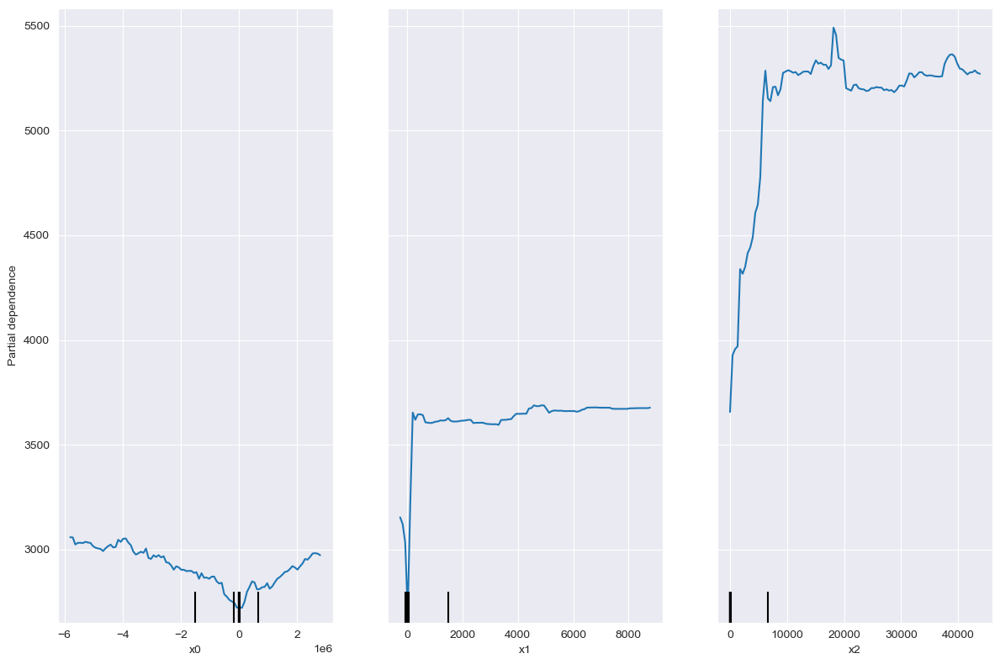

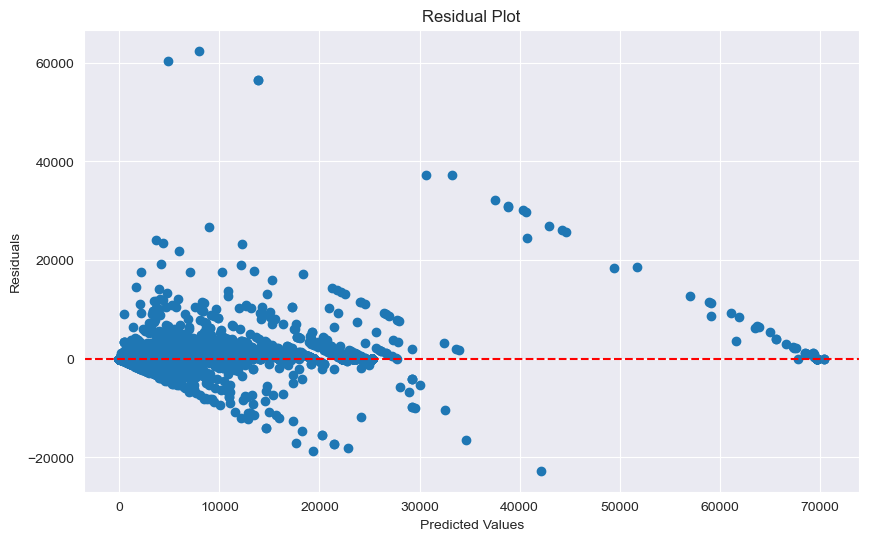

In [4]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Identify the selected features
selected_features = X.columns[selector.get_support()].tolist()
print("Selected features:", selected_features)

# Train a linear model with selected features for comparison
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train_new, y_train)
lr_pred = lr_model.predict(X_test_new)
lr_r2 = r2_score(y_test, lr_pred)
print(f"Linear Regression R2: {lr_r2}")

# Partial dependence plots
fig, ax = plt.subplots(figsize=(12, 8))
display = PartialDependenceDisplay.from_estimator(
    rf_model_new, X_train_new, features=[0, 1, 2], ax=ax
)
plt.tight_layout()
plt.show()

# Residual plot
residuals = y_test - y_pred_new
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_new, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

Feature ranking:
1: feature investments_squared (0.2716898725485206)
2: feature revenue_squared (0.246998365759314)
3: feature investmentsc_squared (0.18323935562783553)
4: feature netinc_squared (0.16787721938363664)
5: feature investments_ncfo (0.06444089511171217)
6: feature ncfo_squared (0.03690412635316019)
7: feature ncfx (0.028850165215820834)


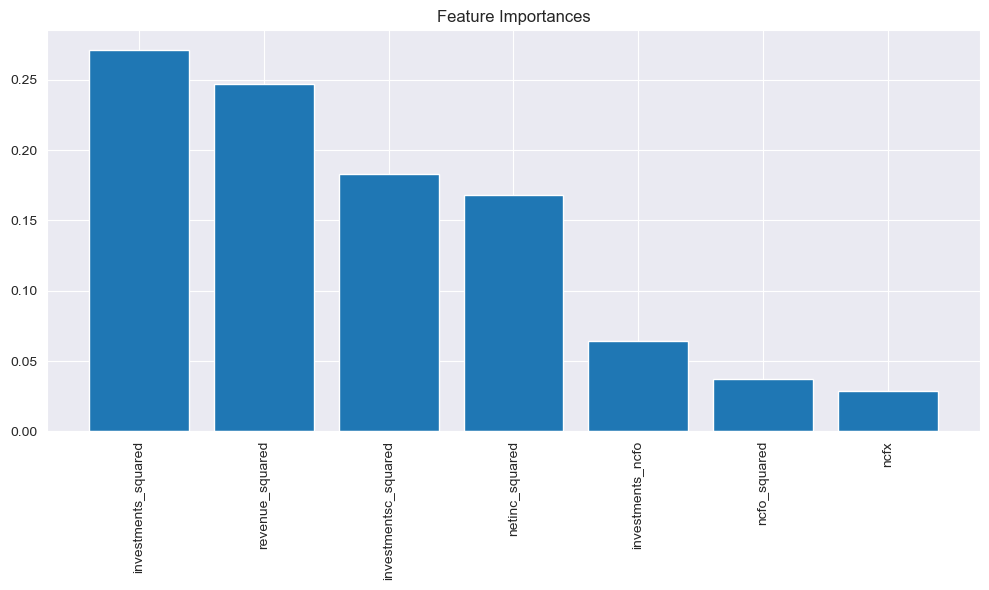

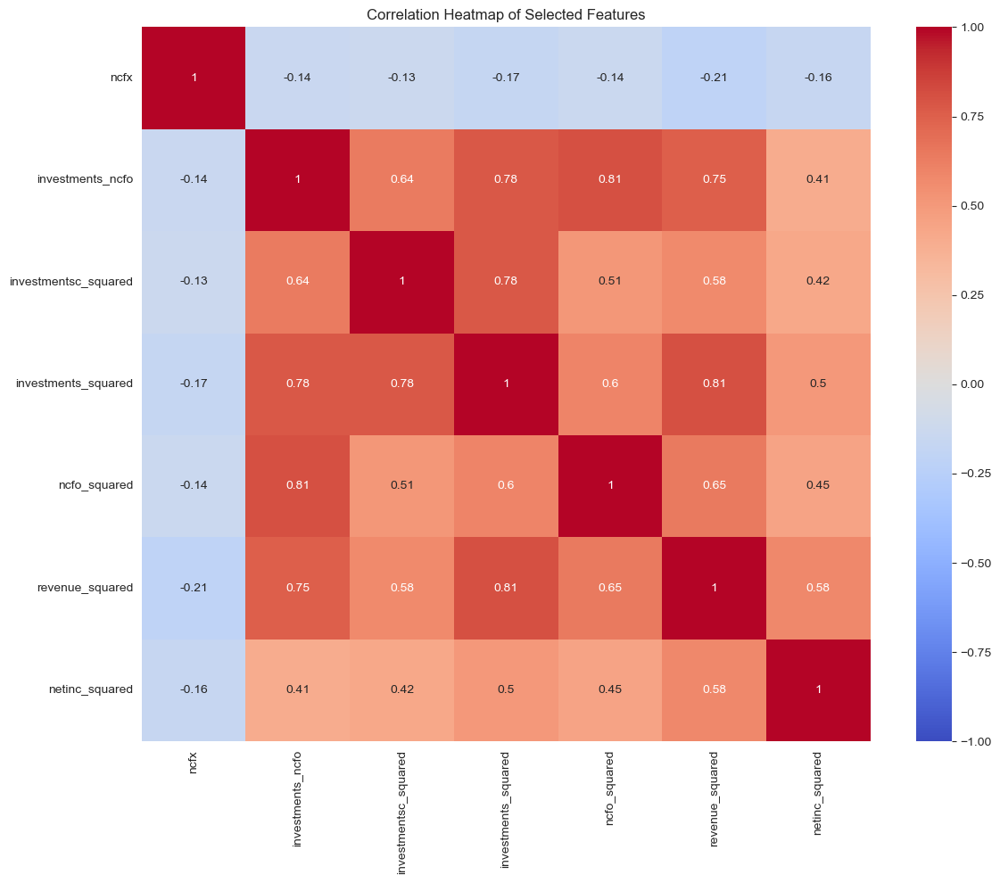

In [5]:
import numpy as np
import seaborn as sns

# Feature importances from Random Forest
importances = rf_model_new.feature_importances_
indices = np.argsort(importances)[::-1]

# Print feature ranking
print("Feature ranking:")
for f, idx in enumerate(indices):
    print("{0}: feature {1} ({2})".format(f + 1, selected_features[idx], importances[idx]))

# Plot feature importances
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
plt.bar(range(X_train_new.shape[1]), importances[indices])
plt.xticks(range(X_train_new.shape[1]), [selected_features[i] for i in indices], rotation=90)
plt.tight_layout()
plt.show()

# Correlation heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(X[selected_features].corr(), annot=True, cmap='coolwarm', vmin=-1, vmax=1, center=0)
plt.title("Correlation Heatmap of Selected Features")
plt.tight_layout()
plt.show()

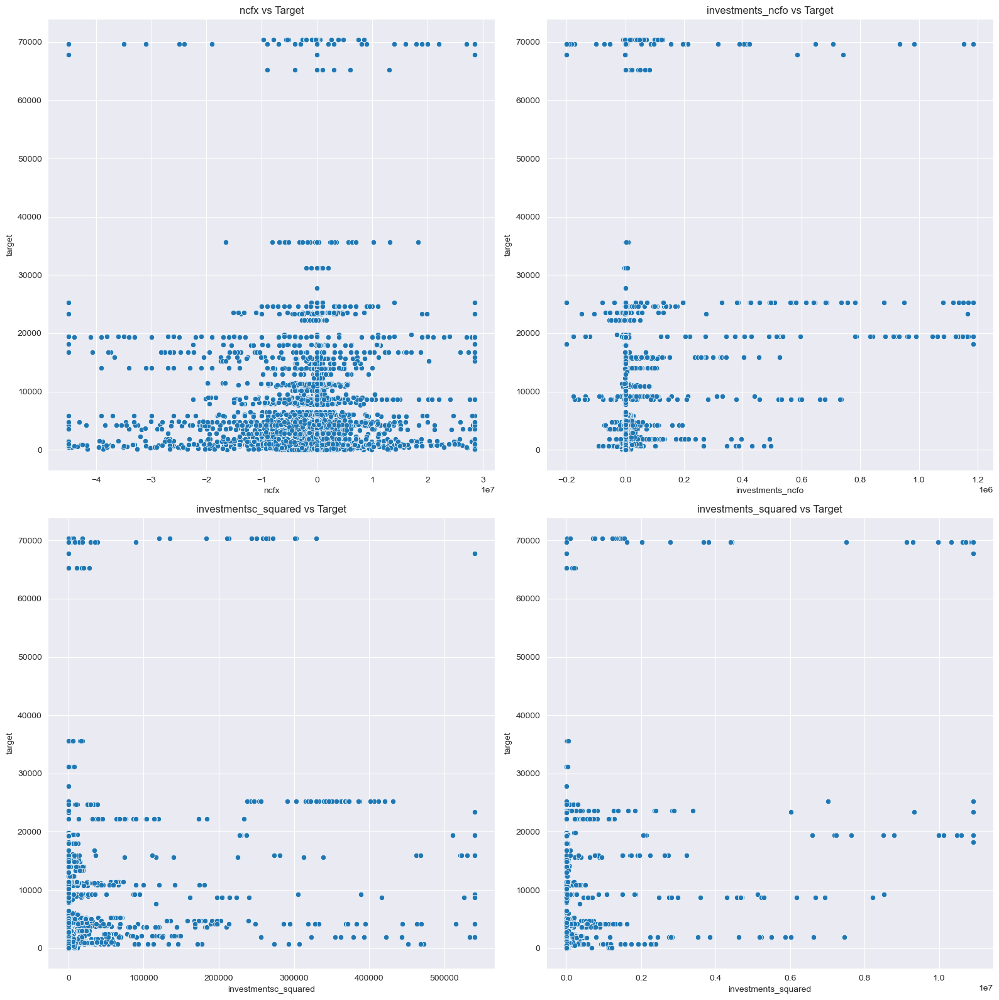

In [6]:
import seaborn as sns
import matplotlib.pyplot as plt

# Combine features and target
data = X[selected_features].copy()
data['target'] = y

# Create scatter plots for top 4 features
fig, axes = plt.subplots(2, 2, figsize=(16, 16))
axes = axes.ravel()

for i, feature in enumerate(selected_features[:4]):
    sns.scatterplot(data=data, x=feature, y='target', ax=axes[i])
    axes[i].set_title(f'{feature} vs Target')

plt.tight_layout()
plt.show()

In [9]:
import pyarrow.parquet as pq
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Function to read a sample of the data
def read_parquet_sample(file_path, sample_size=100000):
    table = pq.read_table(file_path)
    df = table.to_pandas()
    return df.sample(n=min(sample_size, len(df)), random_state=42)

# Read a sample of the dataset
sample_size = 100000  # Adjust this based on your computer's capabilities
X = read_parquet_sample('preprocessed_features.parquet', sample_size)
y = read_parquet_sample('target_variable.parquet', sample_size)['marketcap_first_day']

print(f"Sample size: {len(X)}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model with fewer trees
rf_model = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Feature Importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 10 Important Features:")
print(feature_importance.head(10))

Sample size: 100000
Mean Squared Error: 365583.41113138647
R-squared Score: 0.9907693150889038

Top 10 Important Features:
                      feature  importance
11              investmentsnc    0.325165
14                         ps    0.186850
26                   evebitda    0.095888
60             netinc_squared    0.095317
25                    assetsc    0.038482
21                     evebit    0.027696
37                liabilities    0.026694
4                         fcf    0.020101
54  revenue_asset_utilization    0.017875
7                      ebitda    0.016212


In [11]:
from sklearn.model_selection import cross_val_score
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LassoCV
import numpy as np

# Cross-validation
cv_scores = cross_val_score(rf_model, X, y, cv=5, scoring='r2')
print(f"Cross-validation R2 scores: {cv_scores}")
print(f"Mean CV R2: {np.mean(cv_scores)}, Std: {np.std(cv_scores)}")

# Feature selection using Lasso
lasso = LassoCV()
selector = SelectFromModel(lasso, prefit=False)
X_new = selector.fit_transform(X, y)
print(f"Number of features selected: {X_new.shape[1]}")

# Train a new model with selected features
X_train_new, X_test_new, y_train, y_test = train_test_split(X_new, y, test_size=0.2, random_state=42)
rf_model_new = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=42)
rf_model_new.fit(X_train_new, y_train)
y_pred_new = rf_model_new.predict(X_test_new)
r2_new = r2_score(y_test, y_pred_new)
print(f"R-squared with selected features: {r2_new}")

Cross-validation R2 scores: [0.98633212 0.99403146 0.98847877 0.99138552 0.99201523]
Mean CV R2: 0.9904486208730641, Std: 0.0027200987920974916
Number of features selected: 7
R-squared with selected features: 0.9295879070699161


Selected features: ['ncfx', 'investments_ncfo', 'investmentsc_squared', 'investments_squared', 'ncfo_squared', 'revenue_squared', 'netinc_squared']
Linear Regression R2: 0.3878668437083903


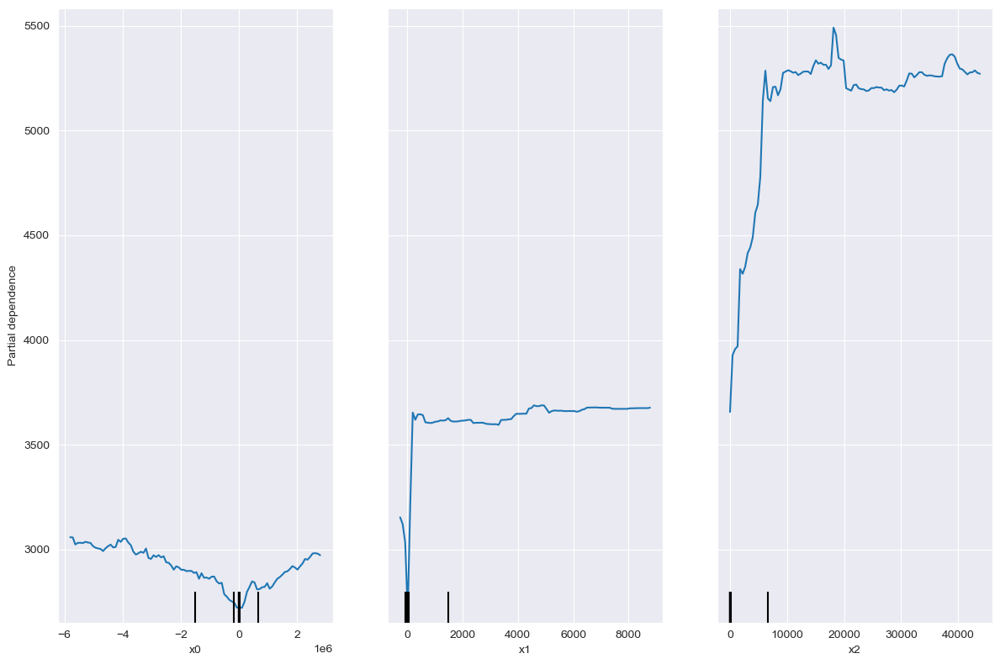

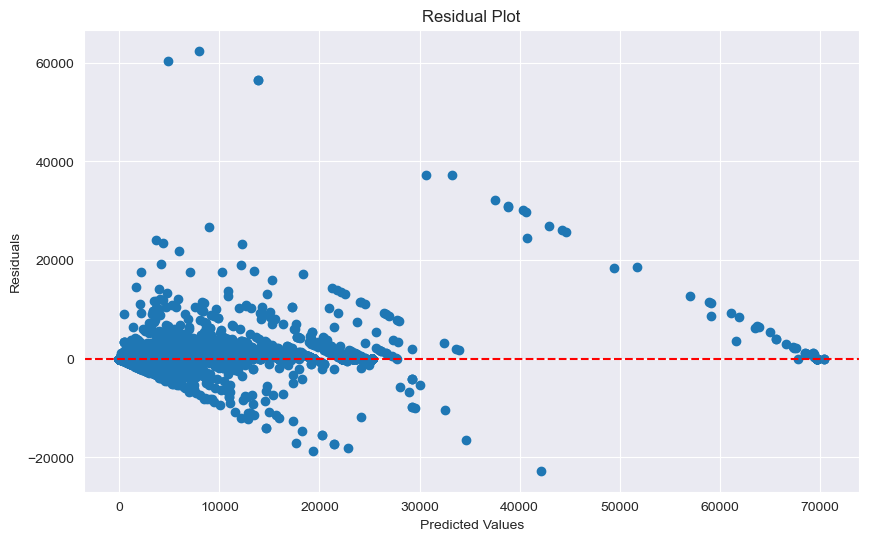

In [13]:
from sklearn.inspection import PartialDependenceDisplay
import matplotlib.pyplot as plt

# Identify the selected features
selected_features = X.columns[selector.get_support()].tolist()
print("Selected features:", selected_features)

# Train a linear model with selected features for comparison
from sklearn.linear_model import LinearRegression
lr_model = LinearRegression()
lr_model.fit(X_train_new, y_train)
lr_pred = lr_model.predict(X_test_new)
lr_r2 = r2_score(y_test, lr_pred)
print(f"Linear Regression R2: {lr_r2}")

# Partial dependence plots
fig, ax = plt.subplots(figsize=(12, 8))
display = PartialDependenceDisplay.from_estimator(
    rf_model_new, X_train_new, features=[0, 1, 2], ax=ax
)
plt.tight_layout()
plt.show()

# Residual plot
residuals = y_test - y_pred_new
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_new, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='r', linestyle='--')
plt.show()

In [15]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import ElasticNet
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score

# Create polynomial features
poly = PolynomialFeatures(degree=2, include_bias=False)
X_poly = poly.fit_transform(X[selected_features])

# Create a pipeline with polynomial features and ElasticNet
elastic_net = Pipeline([
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('elastic', ElasticNet(random_state=42, max_iter=10000, tol=1e-4))
])

# Fit the model
elastic_net.fit(X[selected_features], y)

# Get feature names
try:
    feature_names = poly.get_feature_names_out(selected_features)
except AttributeError:
    # For older versions of scikit-learn
    feature_names = poly.get_feature_names(selected_features)

# Print coefficients
coefficients = elastic_net.named_steps['elastic'].coef_
for name, coef in zip(feature_names, coefficients):
    if coef != 0:
        print(f"{name}: {coef}")

# Evaluate the model
y_pred_elastic = elastic_net.predict(X[selected_features])
r2_elastic = r2_score(y, y_pred_elastic)
print(f"R-squared with ElasticNet: {r2_elastic}")

ncfx: -2.6031524034168952e-05
investments_ncfo: -0.013183956870968608
investmentsc_squared: 0.011917110609726621
investments_squared: 0.0074984134819361635
ncfo_squared: 0.1964593524506798
revenue_squared: 0.005922009656606298
netinc_squared: 0.37500859881657134
ncfx^2: -2.061549897341689e-13
ncfx investments_ncfo: 3.824499855180912e-11
ncfx investmentsc_squared: 1.685592876513887e-10
ncfx investments_squared: -7.745508037031313e-12
ncfx ncfo_squared: -5.18155451994701e-10
ncfx revenue_squared: -1.5205335007556448e-13
ncfx netinc_squared: 4.32219421713544e-10
investments_ncfo^2: -2.528247036919456e-08
investments_ncfo investmentsc_squared: 1.4631132418851785e-10
investments_ncfo investments_squared: -3.5582196737617607e-10
investments_ncfo ncfo_squared: -2.3837439067330779e-07
investments_ncfo revenue_squared: -3.0438451403659814e-10
investments_ncfo netinc_squared: 1.0273999309548056e-08
investmentsc_squared^2: -4.333655260550493e-08
investmentsc_squared investments_squared: -8.127825

C:\Users\Katarina\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.520e+11, tolerance: 4.067e+08
  model = cd_fast.enet_coordinate_descent(


In [16]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X[selected_features])

elastic_net = Pipeline([
    ('poly', PolynomialFeatures(degree=2, include_bias=False)),
    ('elastic', ElasticNet(random_state=42, max_iter=10000, tol=1e-4))
])

elastic_net.fit(X_scaled, y)

Pipeline(steps=[('poly', PolynomialFeatures(include_bias=False)),
                ('elastic', ElasticNet(max_iter=10000, random_state=42))])

In [17]:
from sklearn.feature_selection import SelectFromModel

selector = SelectFromModel(estimator=ElasticNet(random_state=42), threshold='median')
X_selected = selector.fit_transform(X_scaled, y)

In [18]:
from sklearn.model_selection import GridSearchCV

param_grid = {
    'elastic__alpha': [0.1, 1, 10],
    'elastic__l1_ratio': [0.1, 0.5, 0.9]
}

grid_search = GridSearchCV(elastic_net, param_grid, cv=5, scoring='r2')
grid_search.fit(X_scaled, y)

print("Best parameters:", grid_search.best_params_)
print("Best R-squared:", grid_search.best_score_)

C:\Users\Katarina\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.059e+11, tolerance: 3.210e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\Katarina\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.713e+11, tolerance: 3.263e+08
  model = cd_fast.enet_coordinate_descent(
C:\Users\Katarina\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.340e+

Best parameters: {'elastic__alpha': 0.1, 'elastic__l1_ratio': 0.9}
Best R-squared: 0.5229946575762471


C:\Users\Katarina\miniconda3\Lib\site-packages\sklearn\linear_model\_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.079e+11, tolerance: 4.067e+08
  model = cd_fast.enet_coordinate_descent(


In [19]:
from sklearn.ensemble import GradientBoostingRegressor

gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_scaled, y)
y_pred_gb = gb_model.predict(X_scaled)
r2_gb = r2_score(y, y_pred_gb)
print(f"R-squared with Gradient Boosting: {r2_gb}")

R-squared with Gradient Boosting: 0.7179244242096445


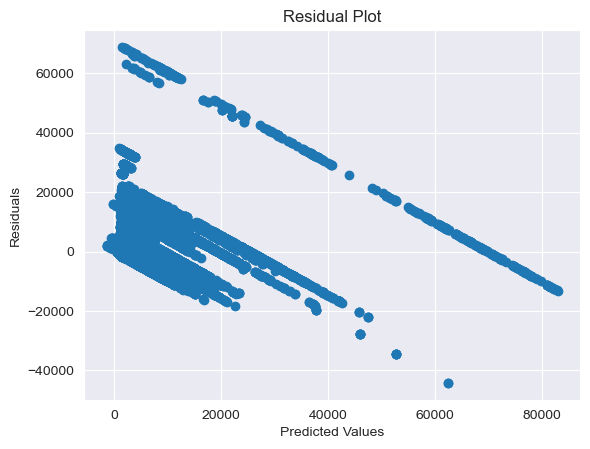

In [20]:
import matplotlib.pyplot as plt

residuals = y - y_pred_elastic
plt.scatter(y_pred_elastic, residuals)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.show()

In [21]:
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import numpy as np

# Ensure X and y are numpy arrays
X = X.values if isinstance(X, pd.DataFrame) else X
y = y.values if isinstance(y, pd.Series) else y

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with scaling and ElasticNetCV
pipeline = Pipeline([
    ('scaler', StandardScaler()),
    ('elastic', ElasticNetCV(
        l1_ratio=[.1, .5, .7, .9, .95, .99, 1],
        eps=1e-3,
        n_alphas=100,
        alphas=None,
        max_iter=10000,
        tol=1e-4,
        cv=5,
        random_state=42
    ))
])

# Fit the model
pipeline.fit(X_train, y_train)

# Get the best parameters
best_alpha = pipeline.named_steps['elastic'].alpha_
best_l1_ratio = pipeline.named_steps['elastic'].l1_ratio_
print(f"Best alpha: {best_alpha}")
print(f"Best l1_ratio: {best_l1_ratio}")

# Make predictions
y_pred = pipeline.predict(X_test)

# Calculate R-squared
r2 = r2_score(y_test, y_pred)
print(f"R-squared: {r2}")

# Print non-zero coefficients
feature_names = selected_features
coef = pipeline.named_steps['elastic'].coef_
for name, c in zip(feature_names, coef):
    if c != 0:
        print(f"{name}: {c}")

Best alpha: 3.6735668585460366
Best l1_ratio: 1.0
R-squared: 0.5334051079059536
ncfx: -1402.6615902624892
investments_ncfo: 8755.588388688058
investmentsc_squared: 603.2960505470522
investments_squared: 3144.3863211746752
ncfo_squared: 49.29270480927671
revenue_squared: 97.01791003434455
netinc_squared: -128.52830166080685


In [23]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"Random Forest R-squared: {r2_rf}")

# Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train_scaled, y_train)
y_pred_gb = gb_model.predict(X_test_scaled)
r2_gb = r2_score(y_test, y_pred_gb)
print(f"Gradient Boosting R-squared: {r2_gb}")

# Feature Importance
print(f"Number of features: {X.shape[1]}")
print(f"RF feature importances length: {len(rf_model.feature_importances_)}")
print(f"GB feature importances length: {len(gb_model.feature_importances_)}")

# Check if selected_features is defined and has the correct length
if 'selected_features' in locals() and len(selected_features) == X.shape[1]:
    feature_importance = pd.DataFrame({
        'feature': selected_features,
        'importance_rf': rf_model.feature_importances_,
        'importance_gb': gb_model.feature_importances_
    })
    print(feature_importance.sort_values('importance_rf', ascending=False))
else:
    print("Cannot create feature importance DataFrame due to mismatch in lengths")
    feature_importance = pd.DataFrame({
        'importance_rf': rf_model.feature_importances_,
        'importance_gb': gb_model.feature_importances_
    })
    print(feature_importance.sort_values('importance_rf', ascending=False))

# Recursive Feature Elimination
rfe = RFE(estimator=RandomForestRegressor(n_estimators=10, random_state=42), n_features_to_select=5)
rfe.fit(X_train_scaled, y_train)
selected_features_rfe = [f"feature_{i}" for i, selected in enumerate(rfe.support_) if selected]
print("Selected features by RFE:", selected_features_rfe)

# Interaction terms
X_interaction = np.column_stack([X_train_scaled, X_train_scaled[:, 0] * X_train_scaled[:, 1]])
rf_model_interaction = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_interaction.fit(X_interaction, y_train)
X_test_interaction = np.column_stack([X_test_scaled, X_test_scaled[:, 0] * X_test_scaled[:, 1]])
y_pred_rf_interaction = rf_model_interaction.predict(X_test_interaction)
r2_rf_interaction = r2_score(y_test, y_pred_rf_interaction)
print(f"Random Forest with interaction R-squared: {r2_rf_interaction}")

X shape: (100000, 61)
y shape: (100000,)
Random Forest R-squared: 0.9908262220983306
Gradient Boosting R-squared: 0.9166894613140834
Number of features: 61
RF feature importances length: 61
GB feature importances length: 61
Cannot create feature importance DataFrame due to mismatch in lengths
    importance_rf  importance_gb
11       0.325471       0.270193
14       0.188360       0.138396
60       0.095502       0.059821
26       0.095362       0.135585
25       0.038126       0.021310
..            ...            ...
15       0.000152       0.000219
17       0.000078       0.000000
36       0.000076       0.001129
39       0.000063       0.000014
33       0.000050       0.000000

[61 rows x 2 columns]
Selected features by RFE: ['feature_11', 'feature_14', 'feature_26', 'feature_37', 'feature_60']
Random Forest with interaction R-squared: 0.9906813015792121


In [3]:
import pyarrow.parquet as pq
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Function to read a sample of the data
def read_parquet_sample(file_path, sample_size=100000):
    table = pq.read_table(file_path)
    df = table.to_pandas()
    return df.sample(n=min(sample_size, len(df)), random_state=42)

# Read a sample of the dataset
sample_size = 100000  # Adjust this based on your computer's capabilities
X = read_parquet_sample('preprocessed_features.parquet', sample_size)
y = read_parquet_sample('target_variable.parquet', sample_size)['marketcap_first_day']

print(f"Sample size: {len(X)}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a Random Forest model with fewer trees
rf_model = RandomForestRegressor(n_estimators=50, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R-squared Score: {r2}")

# Feature Importance
feature_importance = pd.DataFrame({
    'feature': X.columns,
    'importance': rf_model.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 10 Important Features:")
print(feature_importance.head(10))

Sample size: 100000
Mean Squared Error: 365583.4111313865
R-squared Score: 0.9907693150889038

Top 10 Important Features:
                      feature  importance
11              investmentsnc    0.325165
14                         ps    0.186850
26                   evebitda    0.095888
60             netinc_squared    0.095317
25                    assetsc    0.038482
21                     evebit    0.027696
37                liabilities    0.026694
4                         fcf    0.020101
54  revenue_asset_utilization    0.017875
7                      ebitda    0.016212


In [4]:
import numpy as np
import pandas as pd
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE

print(f"X shape: {X.shape}")
print(f"y shape: {y.shape}")

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Random Forest
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)
y_pred_rf = rf_model.predict(X_test_scaled)
r2_rf = r2_score(y_test, y_pred_rf)
print(f"Random Forest R-squared: {r2_rf}")

# Gradient Boosting
gb_model = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb_model.fit(X_train_scaled, y_train)
y_pred_gb = gb_model.predict(X_test_scaled)
r2_gb = r2_score(y_test, y_pred_gb)
print(f"Gradient Boosting R-squared: {r2_gb}")

# Feature Importance
print(f"Number of features: {X.shape[1]}")
print(f"RF feature importances length: {len(rf_model.feature_importances_)}")
print(f"GB feature importances length: {len(gb_model.feature_importances_)}")

# Check if selected_features is defined and has the correct length
if 'selected_features' in locals() and len(selected_features) == X.shape[1]:
    feature_importance = pd.DataFrame({
        'feature': selected_features,
        'importance_rf': rf_model.feature_importances_,
        'importance_gb': gb_model.feature_importances_
    })
    print(feature_importance.sort_values('importance_rf', ascending=False))
else:
    print("Cannot create feature importance DataFrame due to mismatch in lengths")
    feature_importance = pd.DataFrame({
        'importance_rf': rf_model.feature_importances_,
        'importance_gb': gb_model.feature_importances_
    })
    print(feature_importance.sort_values('importance_rf', ascending=False))

# Recursive Feature Elimination
rfe = RFE(estimator=RandomForestRegressor(n_estimators=10, random_state=42), n_features_to_select=5)
rfe.fit(X_train_scaled, y_train)
selected_features_rfe = [f"feature_{i}" for i, selected in enumerate(rfe.support_) if selected]
print("Selected features by RFE:", selected_features_rfe)

# Interaction terms
X_interaction = np.column_stack([X_train_scaled, X_train_scaled[:, 0] * X_train_scaled[:, 1]])
rf_model_interaction = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model_interaction.fit(X_interaction, y_train)
X_test_interaction = np.column_stack([X_test_scaled, X_test_scaled[:, 0] * X_test_scaled[:, 1]])
y_pred_rf_interaction = rf_model_interaction.predict(X_test_interaction)
r2_rf_interaction = r2_score(y_test, y_pred_rf_interaction)
print(f"Random Forest with interaction R-squared: {r2_rf_interaction}")

X shape: (100000, 61)
y shape: (100000,)
Random Forest R-squared: 0.9908262220983306
Gradient Boosting R-squared: 0.9166894613140834
Number of features: 61
RF feature importances length: 61
GB feature importances length: 61
Cannot create feature importance DataFrame due to mismatch in lengths
    importance_rf  importance_gb
11       0.325471       0.270193
14       0.188360       0.138396
60       0.095502       0.059821
26       0.095362       0.135585
25       0.038126       0.021310
..            ...            ...
15       0.000152       0.000219
17       0.000078       0.000000
36       0.000076       0.001129
39       0.000063       0.000014
33       0.000050       0.000000

[61 rows x 2 columns]
Selected features by RFE: ['feature_11', 'feature_14', 'feature_26', 'feature_37', 'feature_60']


KeyboardInterrupt: 

In [5]:
# Part 1: Feature Importance Analysis

from sklearn.ensemble import RandomForestRegressor
import pandas as pd

# mapping of feature numbers to names
feature_names = {i: f"Feature_{i}" for i in range(X.shape[1])}

# Train initial Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Get feature importances
feature_importance = pd.DataFrame({
    'feature': [feature_names[i] for i in range(X.shape[1])],
    'importance_rf': rf_model.feature_importances_
})

# Print top 10 features by importance
top_features = feature_importance.sort_values('importance_rf', ascending=False).head(10)
print("Top 10 features by Random Forest importance:")
for idx, row in top_features.iterrows():
    print(f"{feature_names[idx]}: {row['importance_rf']}")

# Save feature importance for later use
feature_importance.to_csv('feature_importance.csv', index=False)

Top 10 features by Random Forest importance:
Feature_11: 0.3254710309048761
Feature_14: 0.1883595774365436
Feature_60: 0.09550195613904876
Feature_26: 0.09536212990734012
Feature_25: 0.03812632636898818
Feature_21: 0.029293447704714645
Feature_37: 0.025789500442811596
Feature_4: 0.02100639540451553
Feature_7: 0.017315250723079573
Feature_54: 0.01659900135582765


In [6]:
# Part 2: Hyperparameter Tuning

from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.ensemble import RandomForestRegressor
from scipy.stats import randint

# Use a smaller subset for hyperparameter tuning
X_sample, _, y_sample, _ = train_test_split(X_train_scaled, y_train, test_size=0.8, random_state=42)

# Hyperparameter tuning for Random Forest with RandomizedSearchCV
param_dist_rf = {
    'n_estimators': randint(50, 300),
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 5)
}
random_search_rf = RandomizedSearchCV(
    RandomForestRegressor(random_state=42),
    param_distributions=param_dist_rf,
    n_iter=20,
    cv=5,
    n_jobs=-1,
    random_state=42
)
random_search_rf.fit(X_sample, y_sample)
print("Best Random Forest parameters:", random_search_rf.best_params_)
print("Best Random Forest R-squared:", random_search_rf.best_score_)

import json
with open('best_rf_params.json', 'w') as f:
    json.dump(random_search_rf.best_params_, f)

Best Random Forest parameters: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 4, 'n_estimators': 157}
Best Random Forest R-squared: 0.9517441204769808


In [7]:
# Part 3: Best Model Training and Evaluation

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
import json

# Load best parameters
with open('best_rf_params.json', 'r') as f:
    best_params = json.load(f)

# Train the best model on the full training set
best_rf = RandomForestRegressor(**best_params, random_state=42)
best_rf.fit(X_train_scaled, y_train)
y_pred_best_rf = best_rf.predict(X_test_scaled)
r2_best_rf = r2_score(y_test, y_pred_best_rf)
print(f"Best Random Forest R-squared on test set: {r2_best_rf}")

# Save the best model for later use
import joblib
joblib.dump(best_rf, 'best_rf_model.joblib')

Best Random Forest R-squared on test set: 0.9903046895755002


['best_rf_model.joblib']

In [9]:
# Part 4: Ensemble Model

from sklearn.ensemble import GradientBoostingRegressor, VotingRegressor
from sklearn.metrics import r2_score
import joblib

# Load the best Random Forest model
best_rf = joblib.load('best_rf_model.joblib')

# Ensemble of best Random Forest and Gradient Boosting
ensemble = VotingRegressor([
    ('rf', best_rf),
    ('gb', GradientBoostingRegressor(n_estimators=100, random_state=42))
])
ensemble.fit(X_train_scaled, y_train)
y_pred_ensemble = ensemble.predict(X_test_scaled)
r2_ensemble = r2_score(y_test, y_pred_ensemble)
print(f"Ensemble R-squared: {r2_ensemble}")

# Save the ensemble model
joblib.dump(ensemble, 'ensemble_model.joblib')

Ensemble R-squared: 0.970630151023605


['ensemble_model.joblib']

Feature importance shape: (61, 2)
Feature importance columns: Index(['feature', 'importance_rf'], dtype='object')
Best RF model loaded successfully.


<Figure size 1200x600 with 0 Axes>

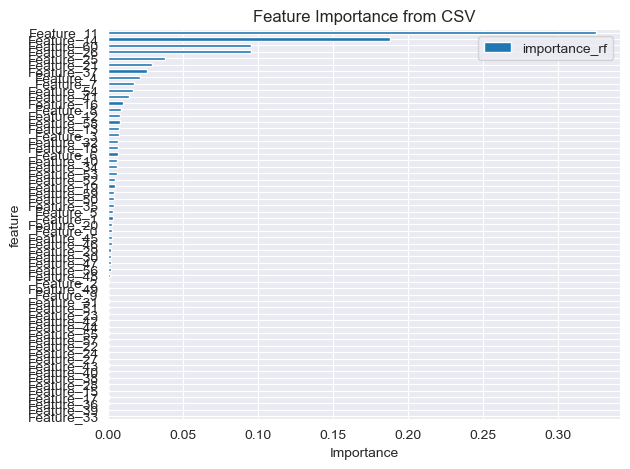


Top 10 features by importance in the best Random Forest model:
       feature  importance
11  Feature_11    0.324469
14  Feature_14    0.189713
60  Feature_60    0.095953
26  Feature_26    0.094743
25  Feature_25    0.038267
21  Feature_21    0.030296
37  Feature_37    0.026185
4    Feature_4    0.021313
7    Feature_7    0.017209
54  Feature_54    0.016872


<Figure size 1200x600 with 0 Axes>

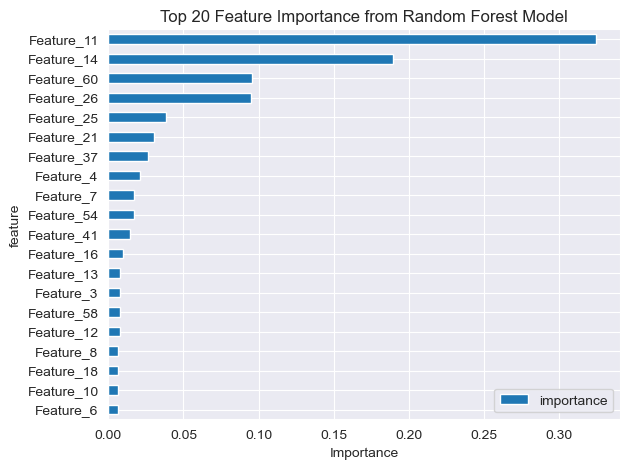


Comparison of feature importance rankings:
            CSV_Rank  RF_Rank
feature                      
Feature_11       1.0      1.0
Feature_14       2.0      2.0
Feature_60       3.0      3.0
Feature_26       4.0      4.0
Feature_25       5.0      5.0
...              ...      ...
Feature_15      57.0     58.0
Feature_17      58.0     59.0
Feature_36      59.0     61.0
Feature_39      60.0     60.0
Feature_33      61.0     57.0

[61 rows x 2 columns]


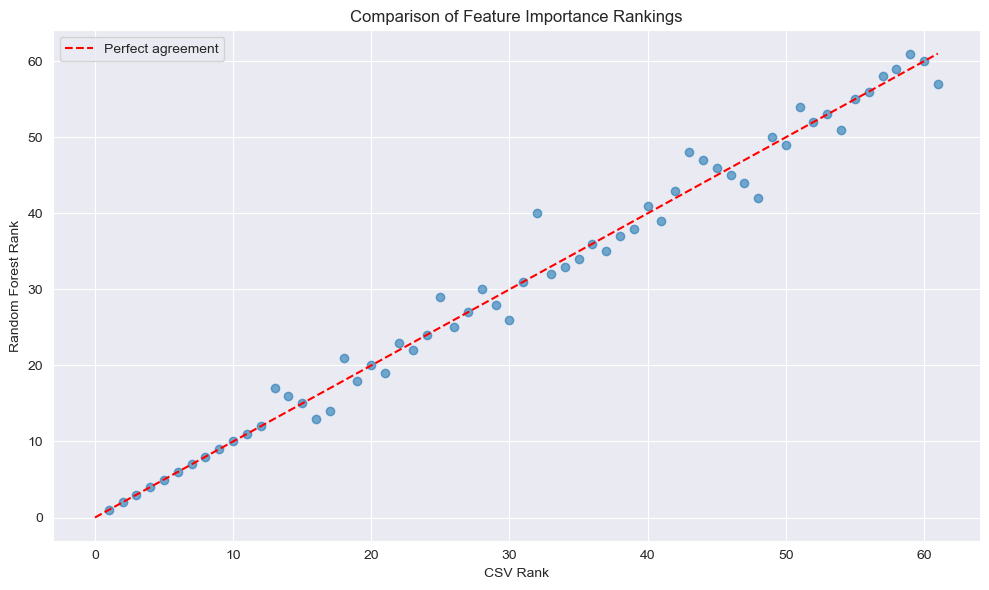

In [12]:
import matplotlib.pyplot as plt
import pandas as pd
import joblib

# Load feature importance
feature_importance = pd.read_csv('feature_importance.csv')
print("Feature importance shape:", feature_importance.shape)
print("Feature importance columns:", feature_importance.columns)

# Load the best Random Forest model
best_rf = joblib.load('best_rf_model.joblib')
print("Best RF model loaded successfully.")

# Visualize feature importance from CSV
plt.figure(figsize=(12, 6))
feature_importance.sort_values('importance_rf', ascending=True).plot(
    x='feature', y='importance_rf', kind='barh'
)
plt.title('Feature Importance from CSV')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

# Feature importance from the best Random Forest model
n_features = len(best_rf.feature_importances_)
feature_names = [f"Feature_{i}" for i in range(n_features)]
rf_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': best_rf.feature_importances_
}).sort_values('importance', ascending=False)

print("\nTop 10 features by importance in the best Random Forest model:")
print(rf_importance.head(10))

# Visualize feature importance from Random Forest model
plt.figure(figsize=(12, 6))
rf_importance.sort_values('importance', ascending=True).tail(20).plot(
    x='feature', y='importance', kind='barh'
)
plt.title('Top 20 Feature Importance from Random Forest Model')
plt.xlabel('Importance')
plt.tight_layout()
plt.show()

# Compare feature importance rankings
csv_ranks = feature_importance.set_index('feature')['importance_rf'].rank(ascending=False)
rf_ranks = rf_importance.set_index('feature')['importance'].rank(ascending=False)

rank_comparison = pd.DataFrame({
    'CSV_Rank': csv_ranks,
    'RF_Rank': rf_ranks
}).sort_values('CSV_Rank')

print("\nComparison of feature importance rankings:")
print(rank_comparison)

# Scatter plot of CSV ranks vs RF ranks
plt.figure(figsize=(10, 6))
plt.scatter(rank_comparison['CSV_Rank'], rank_comparison['RF_Rank'], alpha=0.6)
plt.xlabel('CSV Rank')
plt.ylabel('Random Forest Rank')
plt.title('Comparison of Feature Importance Rankings')
plt.plot([0, n_features], [0, n_features], 'r--', label='Perfect agreement')
plt.legend()
plt.tight_layout()
plt.show()

In [15]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

models = {
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingRegressor(n_estimators=100, random_state=42),
    'Extra Trees': ExtraTreesRegressor(n_estimators=100, random_state=42),
    'SVR': SVR(kernel='rbf'),
    'Neural Network': MLPRegressor(hidden_layer_sizes=(100, 50), max_iter=1000, random_state=42),
    'XGBoost': XGBRegressor(n_estimators=100, random_state=42),
    'LightGBM': LGBMRegressor(n_estimators=100, random_state=42)
}

# Create pipelines
pipelines = {name: Pipeline([
    ('scaler', StandardScaler()),
    ('model', model)
]) for name, model in models.items()}

# Perform cross-validation
cv_results = {}
for name, pipeline in pipelines.items():
    scores = cross_val_score(pipeline, X_train, y_train, cv=5, scoring='r2')
    cv_results[name] = {
        'mean_score': np.mean(scores),
        'std_score': np.std(scores)
    }
    print(f"{name} - Mean R2: {cv_results[name]['mean_score']:.4f} (+/- {cv_results[name]['std_score']*2:.4f})")

# Find the best model
best_model_name = max(cv_results, key=lambda x: cv_results[x]['mean_score'])
best_pipeline = pipelines[best_model_name]

# Train the best model on the full training set
best_pipeline.fit(X_train, y_train)

# Make predictions on the test set
y_pred = best_pipeline.predict(X_test)

# Calculate final metrics
r2 = r2_score(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)

print(f"\nBest Model: {best_model_name}")
print(f"Test R2 Score: {r2:.4f}")
print(f"Test MSE: {mse:.4f}")

# Feature importance (if applicable)
if hasattr(best_pipeline.named_steps['model'], 'feature_importances_'):
    importances = best_pipeline.named_steps['model'].feature_importances_
    feature_importance = pd.DataFrame({'feature': X_train.columns, 'importance': importances})
    feature_importance = feature_importance.sort_values('importance', ascending=False)
    print("\nTop 10 Important Features:")
    print(feature_importance.head(10))

Random Forest - Mean R2: 0.9891 (+/- 0.0089)
Gradient Boosting - Mean R2: 0.9220 (+/- 0.0094)
Extra Trees - Mean R2: 0.9948 (+/- 0.0038)
SVR - Mean R2: -0.0543 (+/- 0.0057)
Neural Network - Mean R2: 0.8733 (+/- 0.0756)
XGBoost - Mean R2: 0.9895 (+/- 0.0040)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005104 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14765
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] Start training from score 2711.111218
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004086 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14765
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] Start training from score 2735.241267
[LightGBM] [Info] Auto-choosing col-wise multi-thr

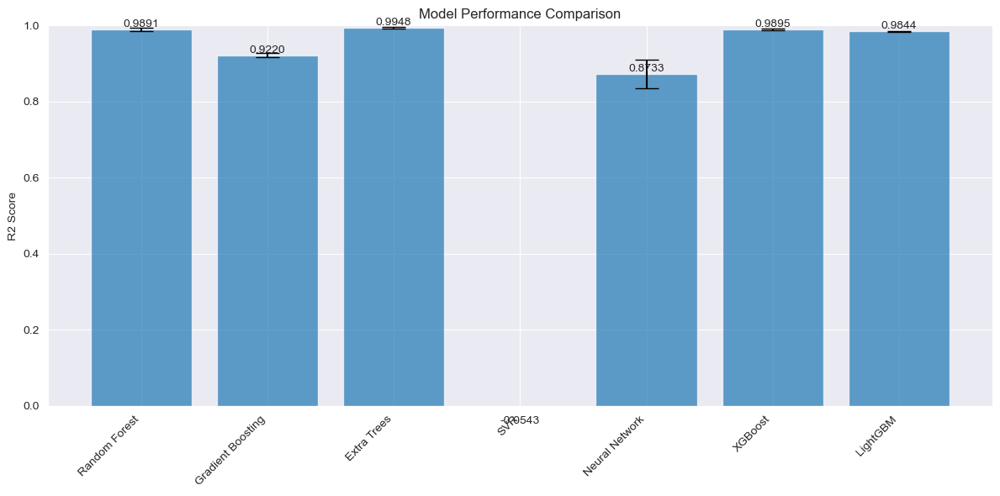

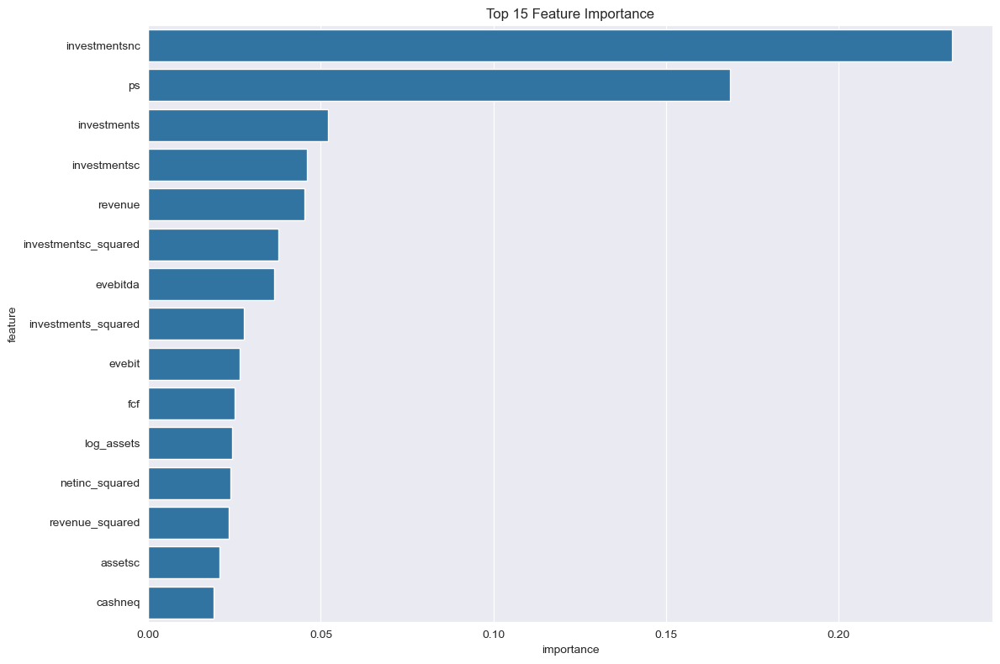

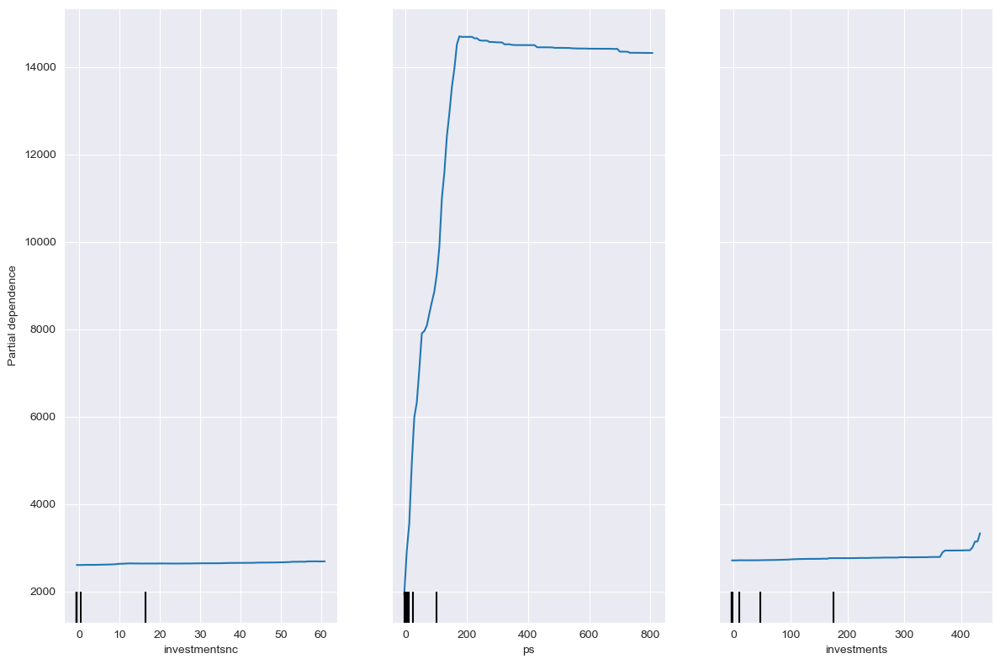

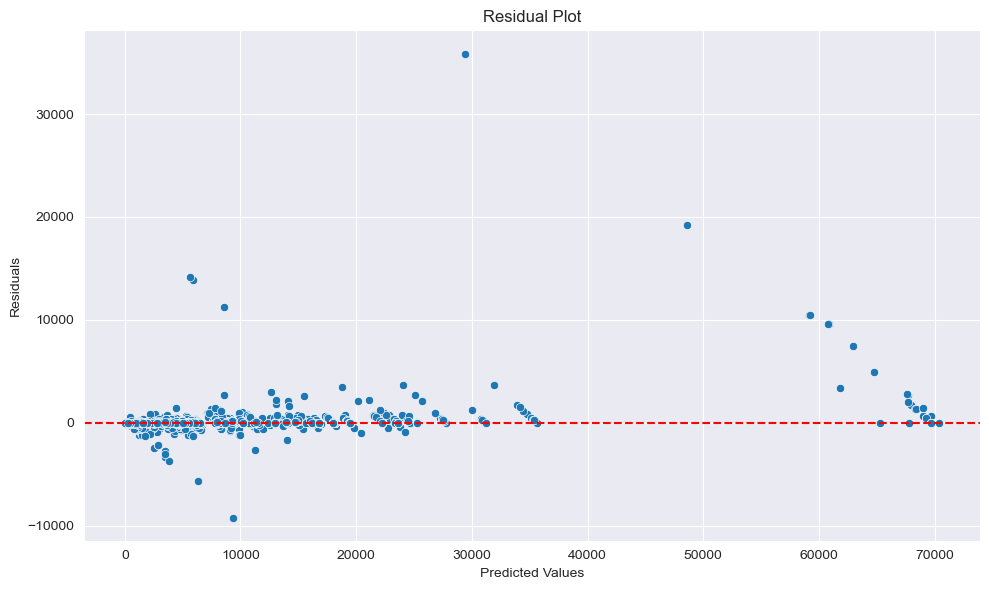

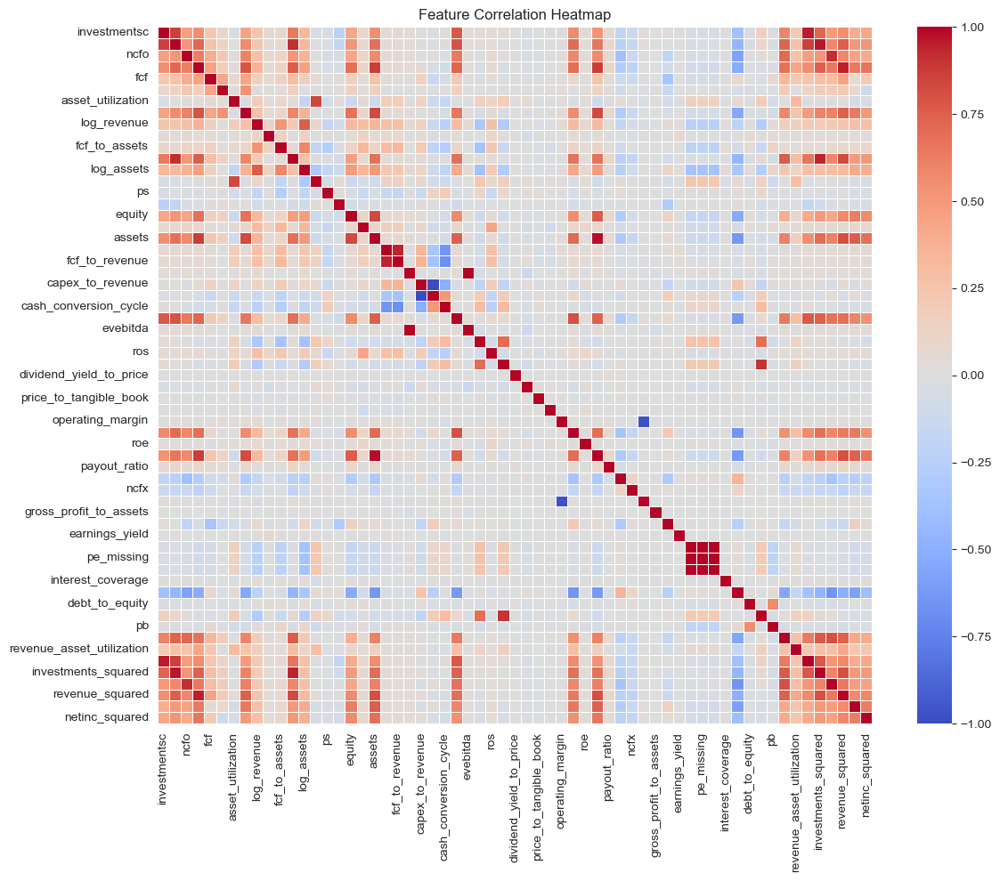

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from sklearn.inspection import PartialDependenceDisplay
from sklearn.inspection import partial_dependence
from sklearn.ensemble import ExtraTreesRegressor

# Recreate the best model (Extra Trees)
best_model = ExtraTreesRegressor(n_estimators=100, random_state=42)
best_model.fit(X_train, y_train)

y_pred = best_model.predict(X_test)

cv_results = {
    'Random Forest': {'mean_score': 0.9891, 'std_score': 0.0089/2},
    'Gradient Boosting': {'mean_score': 0.9220, 'std_score': 0.0094/2},
    'Extra Trees': {'mean_score': 0.9948, 'std_score': 0.0038/2},
    'SVR': {'mean_score': -0.0543, 'std_score': 0.0057/2},
    'Neural Network': {'mean_score': 0.8733, 'std_score': 0.0756/2},
    'XGBoost': {'mean_score': 0.9895, 'std_score': 0.0040/2},
    'LightGBM': {'mean_score': 0.9844, 'std_score': 0.0036/2}
}

# Create feature_importance DataFrame
feature_importance = pd.DataFrame({
    'feature': X_train.columns,
    'importance': best_model.feature_importances_
}).sort_values('importance', ascending=False)

# 1. Model Performance Comparison
def plot_model_performance(cv_results):
    models = list(cv_results.keys())
    means = [cv_results[model]['mean_score'] for model in models]
    stds = [cv_results[model]['std_score'] for model in models]

    fig, ax = plt.subplots(figsize=(12, 6))
    bars = ax.bar(models, means, yerr=stds, capsize=10, alpha=0.7)
    ax.set_ylabel('R2 Score')
    ax.set_title('Model Performance Comparison')
    ax.set_ylim(0, 1)  # Assuming R2 score range

    # Add value labels on the bars
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{height:.4f}', ha='center', va='bottom')

    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# 2. Feature Importance
def plot_feature_importance(feature_importance):
    plt.figure(figsize=(12, 8))
    sns.barplot(x='importance', y='feature', data=feature_importance.head(15))
    plt.title('Top 15 Feature Importance')
    plt.tight_layout()
    plt.show()

# 3. Actual vs Predicted Plot
def plot_actual_vs_predicted(y_test, y_pred):
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=y_test, y=y_pred, mode='markers',
                             marker=dict(color='blue', size=8, opacity=0.6),
                             name='Data Points'))
    fig.add_trace(go.Scatter(x=[y_test.min(), y_test.max()],
                             y=[y_test.min(), y_test.max()],
                             mode='lines', name='Perfect Prediction',
                             line=dict(color='red', dash='dash')))
    fig.update_layout(title='Actual vs Predicted',
                      xaxis_title='Actual Values',
                      yaxis_title='Predicted Values',
                      width=800, height=600)
    fig.write_html("actual_vs_predicted.html")

# 4. Partial Dependence Plots
def plot_partial_dependence(model, X, features):
    fig, ax = plt.subplots(figsize=(12, 4 * (len(features) + 1) // 2))
    display = PartialDependenceDisplay.from_estimator(model, X, features, ax=ax)
    plt.tight_layout()
    plt.show()

# 5. Residual Plot
def plot_residuals(y_test, y_pred):
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=y_pred, y=residuals)
    plt.axhline(y=0, color='r', linestyle='--')
    plt.xlabel('Predicted Values')
    plt.ylabel('Residuals')
    plt.title('Residual Plot')
    plt.tight_layout()
    plt.show()

# 6. Feature Correlation Heatmap
def plot_correlation_heatmap(X):
    corr = X.corr()
    plt.figure(figsize=(12, 10))
    sns.heatmap(corr, cmap='coolwarm', annot=False, linewidths=0.5)
    plt.title('Feature Correlation Heatmap')
    plt.tight_layout()
    plt.show()

# Run all visualizations
plot_model_performance(cv_results)
plot_feature_importance(feature_importance)
plot_actual_vs_predicted(y_test, y_pred)
plot_partial_dependence(best_model, X_train, ['investmentsnc', 'ps', 'investments'])
plot_residuals(y_test, y_pred)
plot_correlation_heatmap(X_train)

In [19]:
import numpy as np
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import StackingRegressor, RandomForestRegressor, ExtraTreesRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.linear_model import RidgeCV

base_models = [
    ('rf', RandomForestRegressor(n_estimators=100, random_state=42)),
    ('et', ExtraTreesRegressor(n_estimators=100, random_state=42)),
    ('xgb', XGBRegressor(n_estimators=100, random_state=42)),
    ('lgb', LGBMRegressor(n_estimators=100, random_state=42))
]

# Create the stacking ensemble
stacking_model = StackingRegressor(
    estimators=base_models,
    final_estimator=RidgeCV(),
    cv=5
)

stacking_model.fit(X_train, y_train)
stacking_score = cross_val_score(stacking_model, X_train, y_train, cv=5, scoring='r2')
print(f"Stacking Ensemble - Mean R2: {np.mean(stacking_score):.4f} (+/- {np.std(stacking_score)*2:.4f})")

# Try CatBoost
catboost_model = CatBoostRegressor(iterations=1000, learning_rate=0.1, depth=6, random_state=42, verbose=False)
catboost_model.fit(X_train, y_train)
catboost_score = cross_val_score(catboost_model, X_train, y_train, cv=5, scoring='r2')
print(f"CatBoost - Mean R2: {np.mean(catboost_score):.4f} (+/- {np.std(catboost_score)*2:.4f})")

# Compare with the best model so far (Extra Trees)
et_model = ExtraTreesRegressor(n_estimators=100, random_state=42)
et_score = cross_val_score(et_model, X_train, y_train, cv=5, scoring='r2')
print(f"Extra Trees - Mean R2: {np.mean(et_score):.4f} (+/- {np.std(et_score)*2:.4f})")

# Identify the best model
models = {
    "Stacking Ensemble": np.mean(stacking_score),
    "CatBoost": np.mean(catboost_score),
    "Extra Trees": np.mean(et_score)
}
best_model_name = max(models, key=models.get)
print(f"\nBest Model: {best_model_name} with R2 score: {models[best_model_name]:.4f}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.006013 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14759
[LightGBM] [Info] Number of data points in the train set: 80000, number of used features: 61
[LightGBM] [Info] Start training from score 2719.084445
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004841 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14759
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] Start training from score 2711.111218
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14764
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] 

In [20]:
import numpy as np
from sklearn.model_selection import cross_val_score, RandomizedSearchCV
from sklearn.ensemble import ExtraTreesRegressor, VotingRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from scipy.stats import randint, uniform

# Fine-tune Extra Trees
et_param_dist = {
    'n_estimators': randint(50, 300),
    'max_depth': randint(10, 50),
    'min_samples_split': randint(2, 11),
    'min_samples_leaf': randint(1, 11)
}

et_random = RandomizedSearchCV(ExtraTreesRegressor(random_state=42),
                               param_distributions=et_param_dist,
                               n_iter=20, cv=5, random_state=42, n_jobs=-1)
et_random.fit(X_train, y_train)

print("Best Extra Trees parameters:", et_random.best_params_)
et_best = et_random.best_estimator_
et_score = cross_val_score(et_best, X_train, y_train, cv=5, scoring='r2')
print(f"Tuned Extra Trees - Mean R2: {np.mean(et_score):.4f} (+/- {np.std(et_score)*2:.4f})")

# Simple Voting Ensemble
voting_model = VotingRegressor([
    ('et', et_best),
    ('xgb', XGBRegressor(n_estimators=100, random_state=42)),
    ('lgb', LGBMRegressor(n_estimators=100, random_state=42))
])
voting_score = cross_val_score(voting_model, X_train, y_train, cv=5, scoring='r2')
print(f"Voting Ensemble - Mean R2: {np.mean(voting_score):.4f} (+/- {np.std(voting_score)*2:.4f})")

# Try CatBoost with fewer iterations
catboost_model = CatBoostRegressor(iterations=100, learning_rate=0.1, depth=6, random_state=42, verbose=False)
catboost_score = cross_val_score(catboost_model, X_train, y_train, cv=5, scoring='r2')
print(f"CatBoost - Mean R2: {np.mean(catboost_score):.4f} (+/- {np.std(catboost_score)*2:.4f})")

# Identify the best model
models = {
    "Tuned Extra Trees": np.mean(et_score),
    "Voting Ensemble": np.mean(voting_score),
    "CatBoost": np.mean(catboost_score)
}
best_model_name = max(models, key=models.get)
print(f"\nBest Model: {best_model_name} with R2 score: {models[best_model_name]:.4f}")

Best Extra Trees parameters: {'max_depth': 44, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 99}
Tuned Extra Trees - Mean R2: 0.9946 (+/- 0.0033)
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004551 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14759
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] Start training from score 2711.111218
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004407 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 14764
[LightGBM] [Info] Number of data points in the train set: 64000, number of used features: 61
[LightGBM] [Info] Start training from score 2735.241267
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004927 seconds.
You can set `force_col_wise=true` to remo

In [22]:
# Save the best model
from joblib import dump
if best_model_name == "Tuned Extra Trees":
    dump(et_best, 'best_model.joblib')
elif best_model_name == "Voting Ensemble":
    dump(voting_model, 'best_model.joblib')
else:
    catboost_model.save_model('best_model.cbm')

print("Best model saved.")

Best model saved.


In [21]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint, uniform

# Assuming X_train, X_test, y_train, y_test are already defined

# 1. Feature Importance Analysis
def analyze_feature_importance(model, X):
    feature_importance = pd.DataFrame({
        'feature': X.columns,
        'importance': model.feature_importances_
    }).sort_values('importance', ascending=False)

    # Plot feature importances
    plt.figure(figsize=(10, 6))
    plt.bar(feature_importance['feature'][:15], feature_importance['importance'][:15])
    plt.title('Top 15 Feature Importances')
    plt.xlabel('Features')
    plt.ylabel('Importance')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('feature_importance.png')
    plt.close()

    return feature_importance

# 2. Hyperparameter Tuning
def tune_extra_trees(X, y):
    # Define the parameter space
    param_dist = {
        'n_estimators': randint(50, 500),
        'max_depth': randint(10, 100),
        'min_samples_split': randint(2, 20),
        'min_samples_leaf': randint(1, 10),
        'max_features': uniform(0.1, 0.9)
    }

    # Create the model
    et = ExtraTreesRegressor(random_state=42)

    # Set up RandomizedSearchCV
    random_search = RandomizedSearchCV(
        et, param_distributions=param_dist, n_iter=100, cv=5,
        scoring='r2', n_jobs=-1, random_state=42, verbose=2
    )

    # Fit RandomizedSearchCV
    random_search.fit(X, y)

    print("Best parameters:", random_search.best_params_)
    print("Best R2 score:", random_search.best_score_)

    return random_search.best_estimator_

# Run feature importance analysis
et_model = ExtraTreesRegressor(n_estimators=100, random_state=42)
et_model.fit(X_train, y_train)
feature_importance = analyze_feature_importance(et_model, X_train)

print("Top 10 most important features:")
print(feature_importance.head(10))

# Run hyperparameter tuning
best_et_model = tune_extra_trees(X_train, y_train)

# Analyze feature importance of the tuned model
tuned_feature_importance = analyze_feature_importance(best_et_model, X_train)

print("\nTop 10 most important features (after tuning):")
print(tuned_feature_importance.head(10))

# Compare performance
original_score = et_model.score(X_test, y_test)
tuned_score = best_et_model.score(X_test, y_test)

print(f"\nOriginal model R2 score on test set: {original_score:.4f}")
print(f"Tuned model R2 score on test set: {tuned_score:.4f}")

Top 10 most important features:
                 feature  importance
11         investmentsnc    0.232924
14                    ps    0.168469
1            investments    0.052110
0           investmentsc    0.045971
3                revenue    0.045224
55  investmentsc_squared    0.037589
26              evebitda    0.036530
56   investments_squared    0.027686
21                evebit    0.026612
4                    fcf    0.025151
Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best parameters: {'max_depth': 56, 'max_features': 0.7419203085006955, 'min_samples_leaf': 1, 'min_samples_split': 6, 'n_estimators': 267}
Best R2 score: 0.9939625455493418

Top 10 most important features (after tuning):
                 feature  importance
11         investmentsnc    0.210511
14                    ps    0.140745
56   investments_squared    0.049135
1            investments    0.047000
0           investmentsc    0.044397
26              evebitda    0.038319
3                r

In [1]:
  import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import ExtraTreesRegressor
import pyarrow.parquet as pq

# Load the data
X = pq.read_table('preprocessed_features.parquet').to_pandas()
y = pq.read_table('target_variable.parquet').to_pandas().squeeze()

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model with fewer estimators and on a subset of data
sample_size = min(10000, len(X_train))
X_train_sample = X_train.sample(sample_size, random_state=42)
y_train_sample = y_train.loc[X_train_sample.index]

et_model = ExtraTreesRegressor(n_estimators=50, random_state=42, n_jobs=-1)
et_model.fit(X_train_sample, y_train_sample)

def interpret_model_with_shap(model, X, max_samples=1000):
    X_sample = X.sample(min(max_samples, len(X)), random_state=42)
    print(f"Calculating SHAP values for {len(X_sample)} samples...")

    explainer = shap.TreeExplainer(model, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_sample, check_additivity=False)

    plt.figure(figsize=(12, 8))
    shap.summary_plot(shap_values, X_sample, plot_type="bar", show=False, max_display=20)
    plt.title("SHAP Feature Importance (Top 20)")
    plt.tight_layout()
    plt.savefig('shap_feature_importance.png')
    plt.close()

    return shap_values, X_sample.columns

# Run the SHAP analysis
shap_values, feature_names = interpret_model_with_shap(et_model, X_test, max_samples=1000)

# Print top 20 most important features
feature_importance = pd.DataFrame({
    'feature': feature_names,
    'importance': np.abs(shap_values).mean(0)
}).sort_values('importance', ascending=False)

print("\nTop 20 most important features:")
print(feature_importance.head(20))

Calculating SHAP values for 1000 samples...

Top 20 most important features:
                    feature   importance
14                       ps  1258.534404
11            investmentsnc   822.415177
3                   revenue   471.683771
12               log_assets   381.663692
8               log_revenue   351.701233
47        marketcap_missing   341.932982
18                   assets   230.220725
35                  cashneq   225.966624
25                  assetsc   200.929173
1               investments   200.208262
4                       fcf   197.733720
58          revenue_squared   194.716506
60           netinc_squared   193.951866
45               pb_missing   190.863060
0              investmentsc   142.604378
56      investments_squared   137.259749
55     investmentsc_squared   133.113074
7                    ebitda   130.466137
41  operating_expense_ratio   123.528864
21                   evebit   120.168380


In [2]:
# Save feature importance to CSV
feature_importance.to_csv('feature_importance.csv', index=False)

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import pyarrow.parquet as pq

# Load the data
X = pq.read_table('preprocessed_features.parquet').to_pandas()
y = pq.read_table('target_variable.parquet').to_pandas().squeeze()

# Take a small subset of the data
sample_size = min(10000, len(X))
X_sample = X.sample(sample_size, random_state=42)
y_sample = y.loc[X_sample.index]

# Train a simpler model on the subset
rf_model = RandomForestRegressor(n_estimators=50, max_depth=5, n_jobs=-1, random_state=42)
rf_model.fit(X_sample, y_sample)

# Function to create SHAP interaction plot
def create_shap_interaction_plot(model, X, feature1, feature2, max_samples=1000):
    X_plot = X.sample(min(max_samples, len(X)), random_state=42)
    explainer = shap.TreeExplainer(model, data=X_plot, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_plot, check_additivity=False)

    plt.figure(figsize=(10, 7))
    shap.dependence_plot(
        feature1, shap_values, X_plot,
        interaction_index=feature2,
        show=False
    )
    plt.title(f'SHAP Interaction Plot: {feature1} vs {feature2}')
    plt.tight_layout()
    plt.savefig(f'shap_interaction_{feature1}_{feature2}.png')
    plt.close()

# Top features from your previous output
top_features = ['ps', 'investmentsnc', 'revenue', 'log_assets', 'log_revenue']

# Create interaction plots for top 5 features
for i in range(len(top_features)):
    for j in range(i+1, len(top_features)):
        create_shap_interaction_plot(rf_model, X_sample, top_features[i], top_features[j], max_samples=1000)
    print(f"Completed plots for {top_features[i]}")

print("SHAP interaction plots have been created and saved.")

Completed plots for ps
Completed plots for investmentsnc
Completed plots for revenue
Completed plots for log_assets
Completed plots for log_revenue
SHAP interaction plots have been created and saved.


<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

<Figure size 1000x700 with 0 Axes>

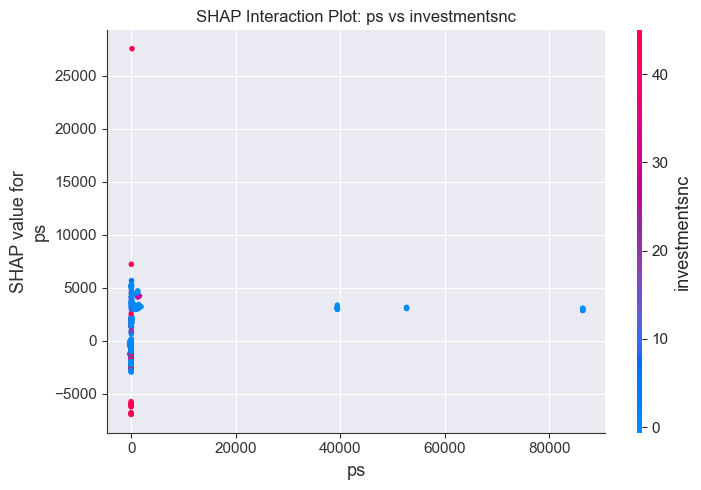

<Figure size 1000x700 with 0 Axes>

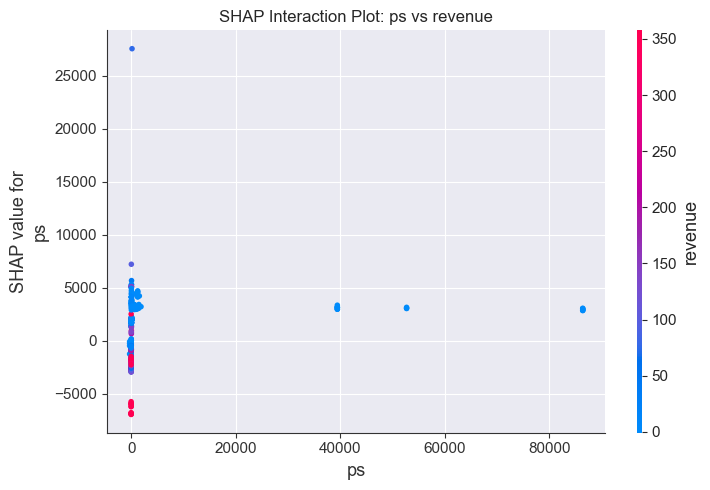

<Figure size 1000x700 with 0 Axes>

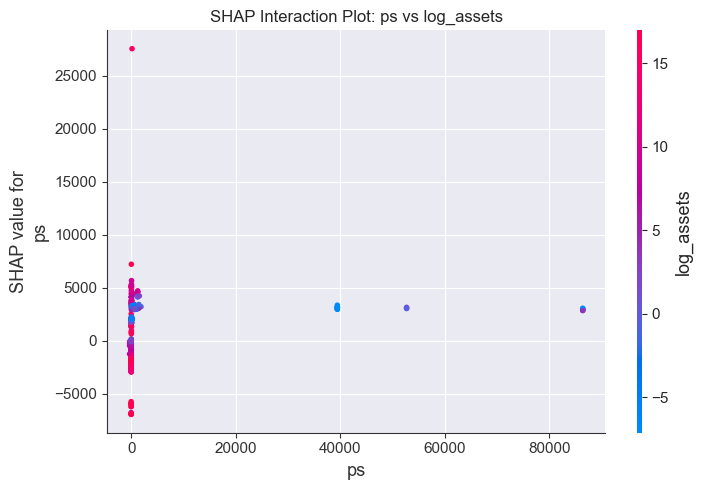

<Figure size 1000x700 with 0 Axes>

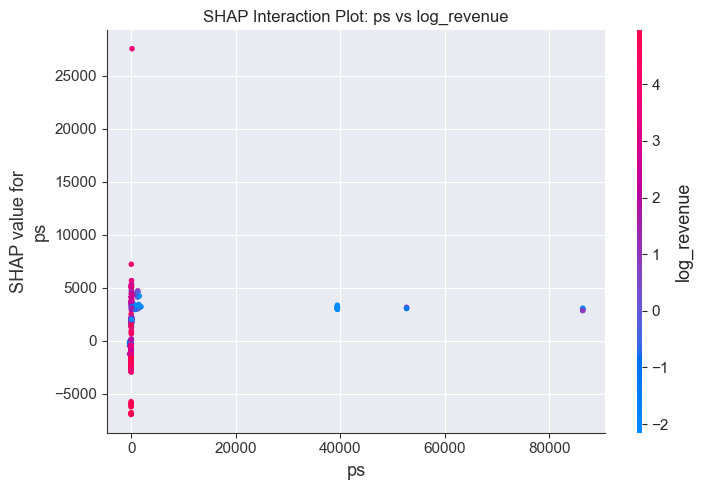

Completed plots for ps


<Figure size 1000x700 with 0 Axes>

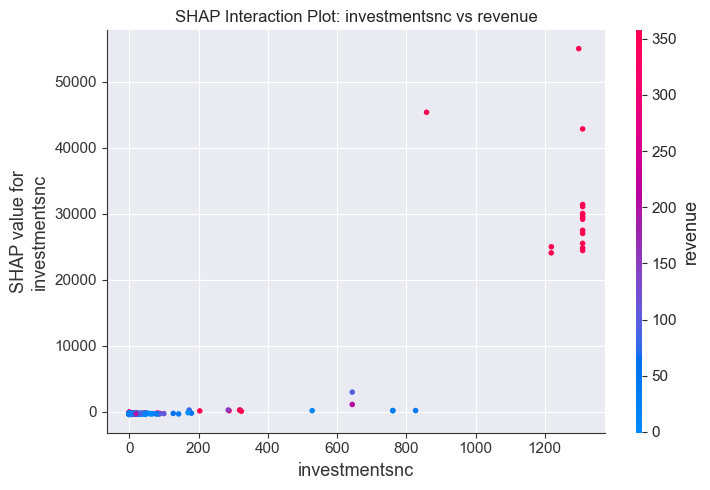

<Figure size 1000x700 with 0 Axes>

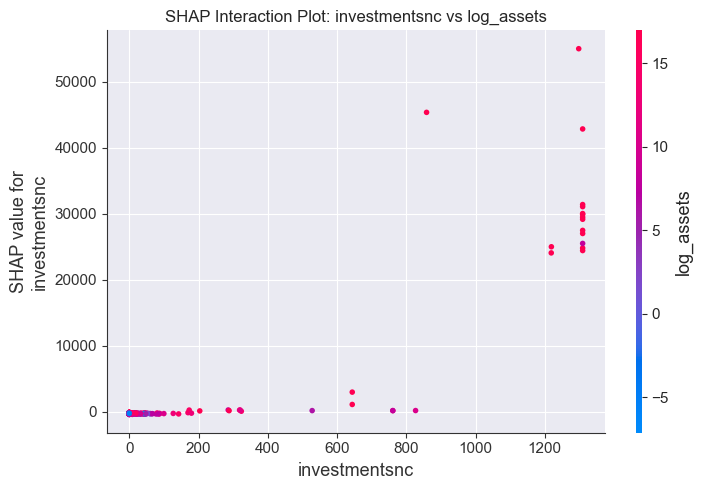

<Figure size 1000x700 with 0 Axes>

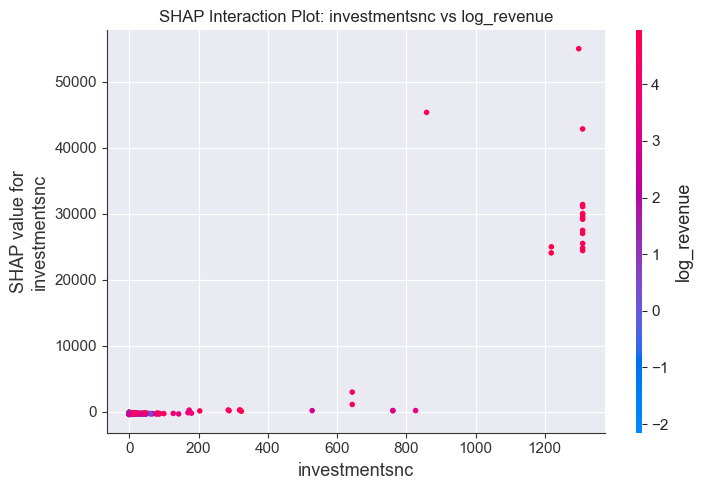

Completed plots for investmentsnc


<Figure size 1000x700 with 0 Axes>

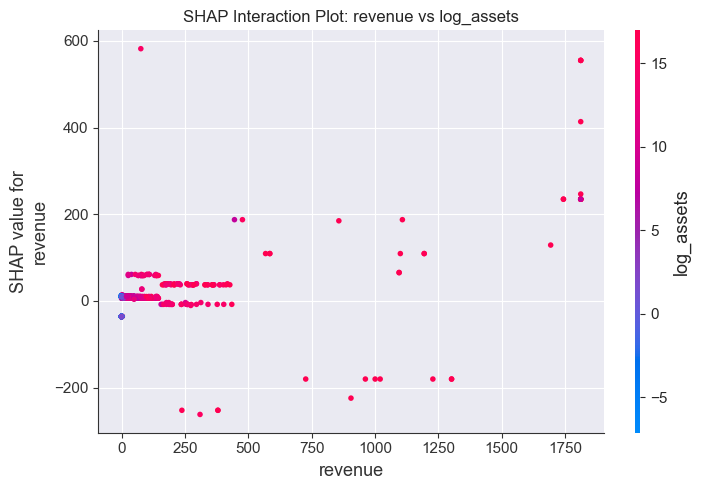

<Figure size 1000x700 with 0 Axes>

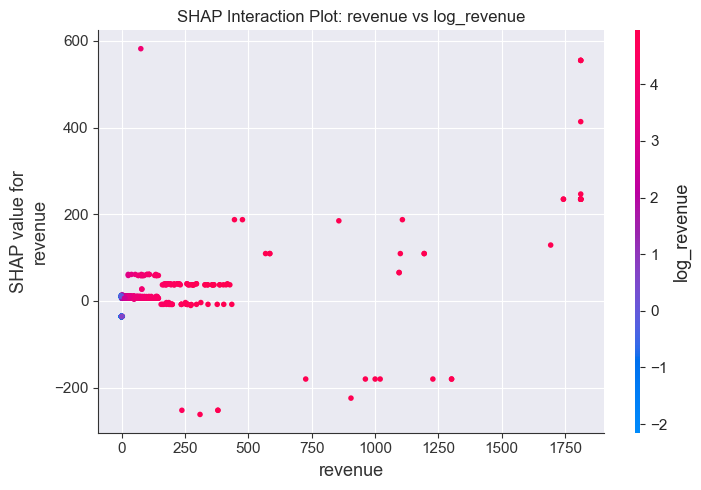

Completed plots for revenue


<Figure size 1000x700 with 0 Axes>

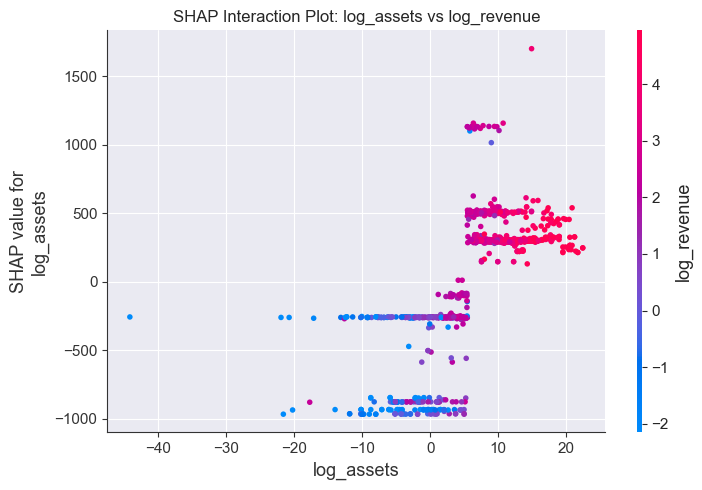

Completed plots for log_assets
Completed plots for log_revenue
SHAP interaction plots have been created and saved.


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import shap
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import pyarrow.parquet as pq

# Load the data
X = pq.read_table('preprocessed_features.parquet').to_pandas()
y = pq.read_table('target_variable.parquet').to_pandas().squeeze()

# Take a small subset of the data
sample_size = min(20000, len(X))
X_sample = X.sample(sample_size, random_state=42)
y_sample = y.loc[X_sample.index]

# Train a simpler model on the subset
rf_model = RandomForestRegressor(n_estimators=50, max_depth=5, n_jobs=-1, random_state=42)
rf_model.fit(X_sample, y_sample)

# Function to create SHAP interaction plot
def create_shap_interaction_plot(model, X, feature1, feature2, max_samples=1000):
    X_plot = X.sample(min(max_samples, len(X)), random_state=42)
    explainer = shap.TreeExplainer(model, data=X_plot, feature_perturbation="interventional")
    shap_values = explainer.shap_values(X_plot, check_additivity=False)

    plt.figure(figsize=(10, 7))
    shap.dependence_plot(
        feature1, shap_values, X_plot,
        interaction_index=feature2,
        show=False
    )
    plt.title(f'SHAP Interaction Plot: {feature1} vs {feature2}')
    plt.tight_layout()
    plt.show()

# Top features from your previous output
top_features = ['ps', 'investmentsnc', 'revenue', 'log_assets', 'log_revenue']

# Create interaction plots for top 5 features
for i in range(len(top_features)):
    for j in range(i+1, len(top_features)):
        create_shap_interaction_plot(rf_model, X_sample, top_features[i], top_features[j], max_samples=1000)
    print(f"Completed plots for {top_features[i]}")

print("SHAP interaction plots have been created and saved.")

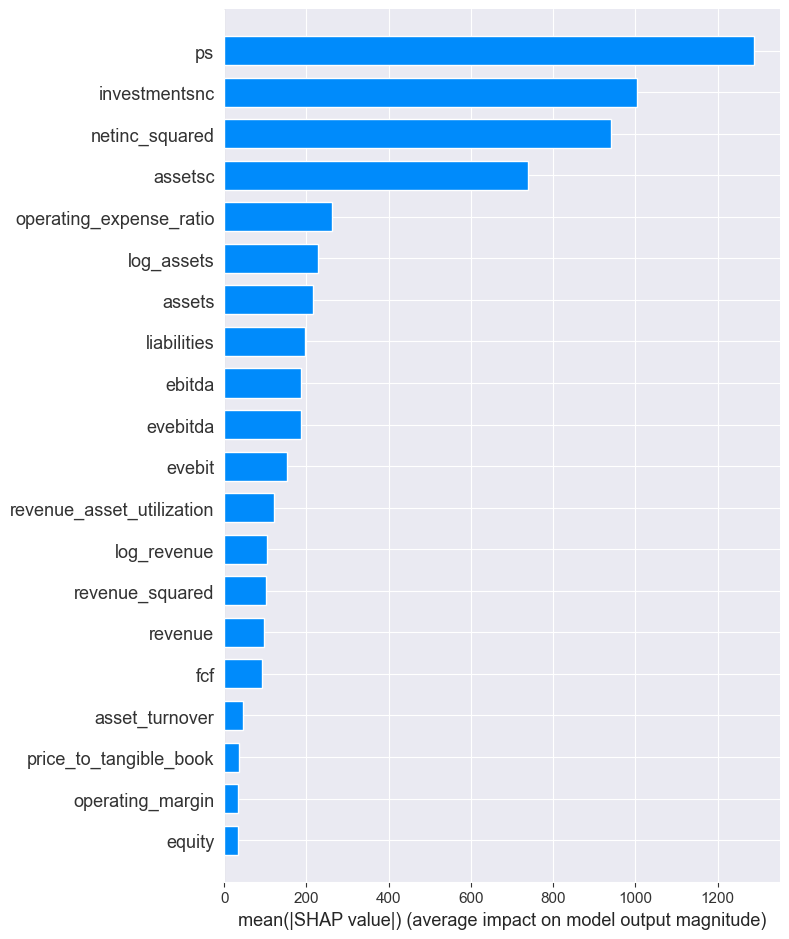

<Figure size 2000x300 with 0 Axes>

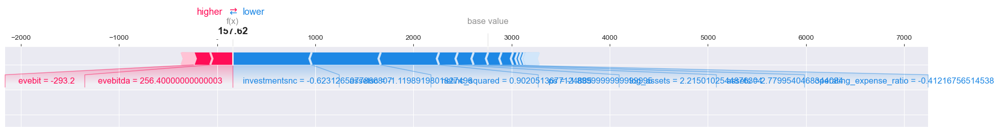

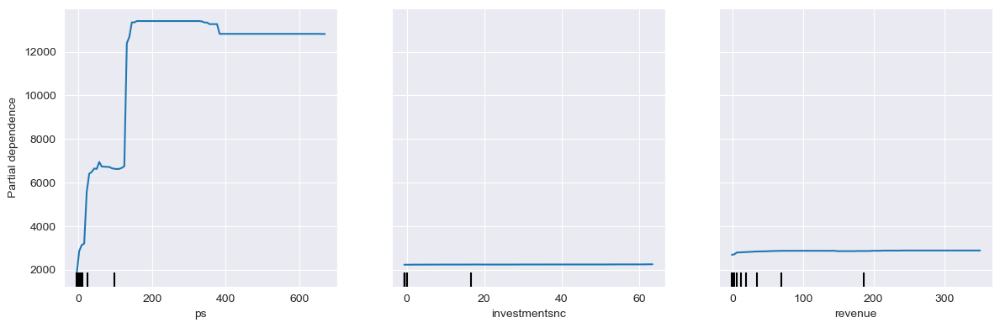

In [5]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
import pyarrow.parquet as pq

# Load the data
X = pq.read_table('preprocessed_features.parquet').to_pandas()
y = pq.read_table('target_variable.parquet').to_pandas().squeeze()

# Take a subset of the data
sample_size = min(30000, len(X))
X_sample = X.sample(sample_size, random_state=42)
y_sample = y.loc[X_sample.index]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, random_state=42)

# Train the model
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Top features
top_features = ['ps', 'investmentsnc', 'revenue', 'log_assets', 'log_revenue']

#SHAP Summary Plot
explainer = shap.TreeExplainer(rf_model)
shap_values = explainer.shap_values(X_test)
plt.figure(figsize=(10, 8))
shap.summary_plot(shap_values, X_test, plot_type="bar", show=False)
plt.tight_layout()
plt.show()

#SHAP Force Plot (for a single prediction)
plt.figure(figsize=(20, 3))
shap.force_plot(explainer.expected_value, shap_values[0,:], X_test.iloc[0,:], show=False, matplotlib=True)
plt.tight_layout()
plt.show()

#Partial Dependence Plots
fig, ax = plt.subplots(figsize=(12, 4))
PartialDependenceDisplay.from_estimator(rf_model, X_train, top_features[:3], ax=ax)
plt.tight_layout()
plt.show()

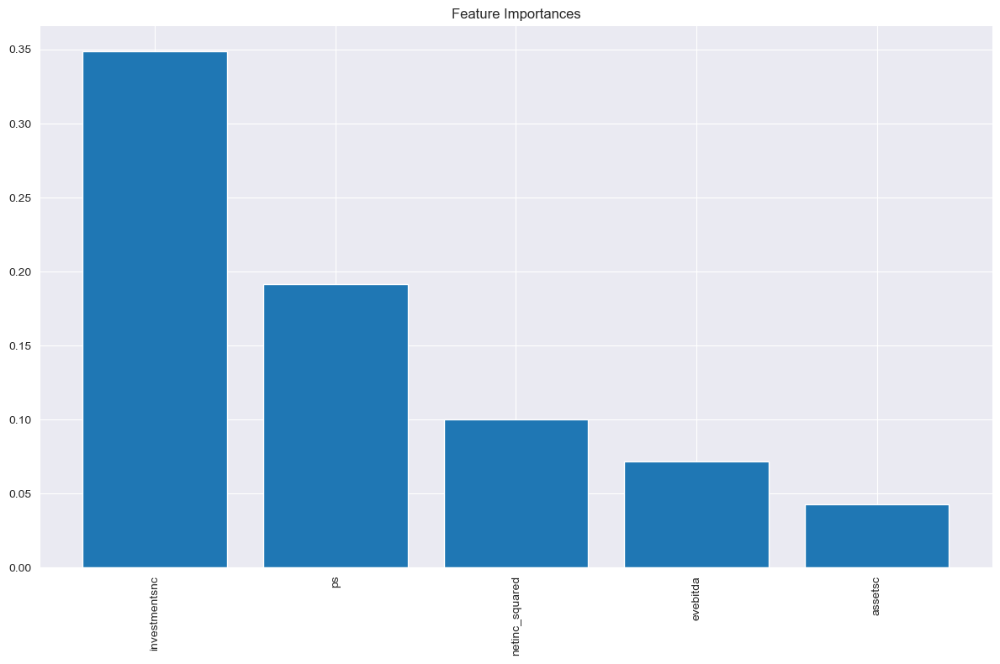

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.ensemble import RandomForestRegressor
from sklearn.inspection import PartialDependenceDisplay
import pyarrow.parquet as pq

# Load the data
X = pq.read_table('preprocessed_features.parquet').to_pandas()
y = pq.read_table('target_variable.parquet').to_pandas().squeeze()

# Take a subset of the data
sample_size = min(50000, len(X))
X_sample = X.sample(sample_size, random_state=42)
y_sample = y.loc[X_sample.index]

# Split the data
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, random_state=42)

# Train the model
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

# Top features
top_features = ['ps', 'investmentsnc', 'revenue', 'log_assets', 'log_revenue']

#Feature Importance Plot
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]
plt.figure(figsize=(12, 8))
plt.title("Feature Importances")
plt.bar(range(len(top_features)), importances[indices][:len(top_features)])
plt.xticks(range(len(top_features)), [X.columns[i] for i in indices][:len(top_features)], rotation=90)
plt.tight_layout()
plt.show()

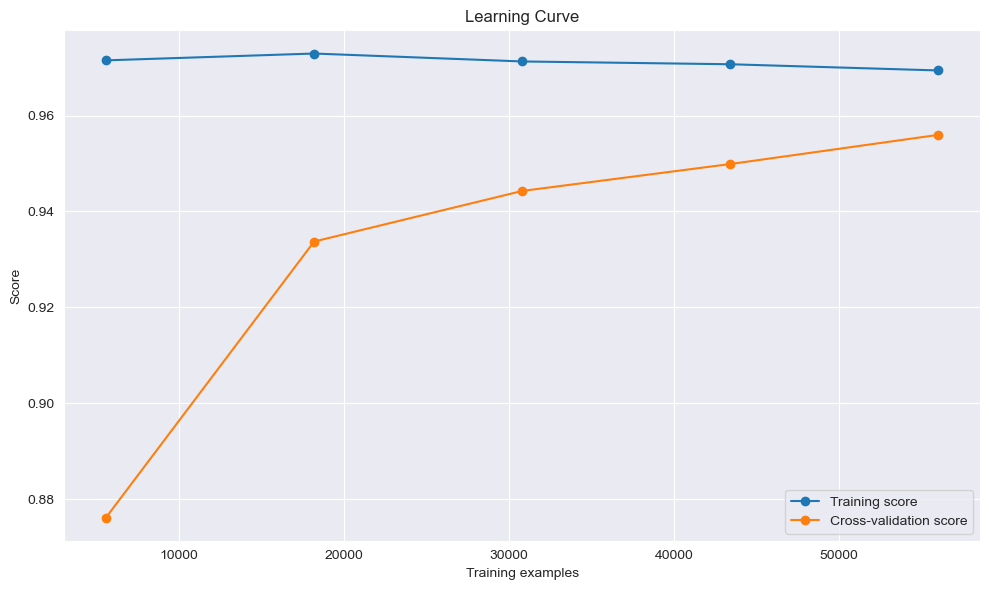

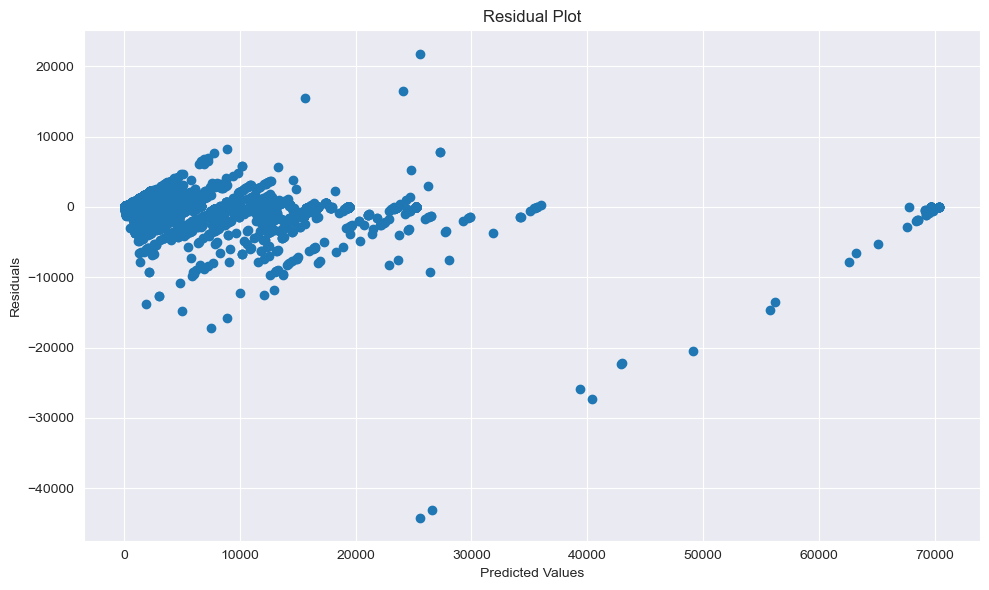

In [3]:
sample_size = min(70000, len(X))
X_sample = X.sample(sample_size, random_state=42)
y_sample = y.loc[X_sample.index]

#Split the data
X_train, X_test, y_train, y_test = train_test_split(X_sample, y_sample, test_size=0.2, random_state=42)

#Train the model
rf_model = RandomForestRegressor(n_estimators=100, max_depth=10, n_jobs=-1, random_state=42)
rf_model.fit(X_train, y_train)

#Top features
top_features = ['ps', 'investmentsnc', 'revenue', 'log_assets', 'log_revenue']

#Learning Curve
train_sizes, train_scores, test_scores = learning_curve(rf_model, X_sample, y_sample, cv=5, n_jobs=-1, train_sizes=np.linspace(0.1, 1.0, 5))
plt.figure(figsize=(10, 6))
plt.plot(train_sizes, np.mean(train_scores, axis=1), 'o-', label='Training score')
plt.plot(train_sizes, np.mean(test_scores, axis=1), 'o-', label='Cross-validation score')
plt.xlabel('Training examples')
plt.ylabel('Score')
plt.title('Learning Curve')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

#Residual Plot
y_pred = rf_model.predict(X_test)
plt.figure(figsize=(10, 6))
plt.scatter(y_pred, y_pred - y_test)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.tight_layout()
plt.show()

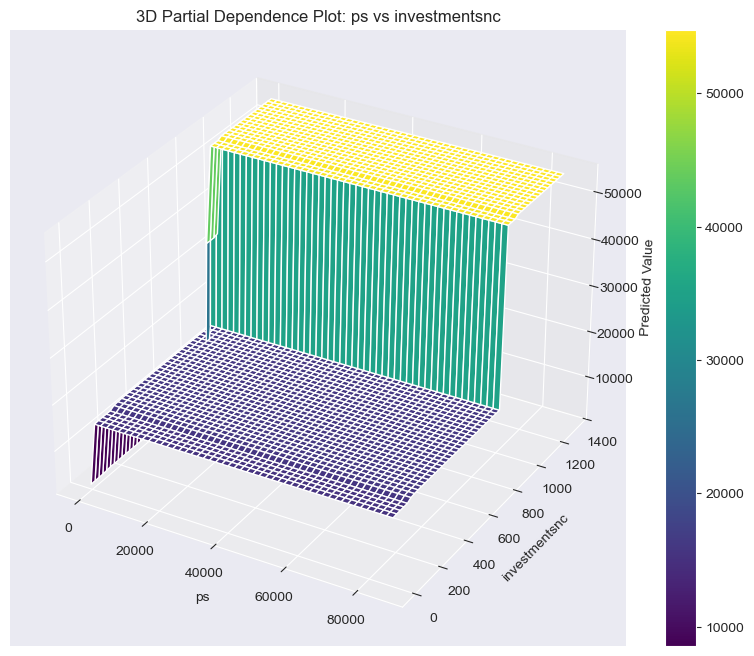

In [4]:
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_partial_dependence(model, X, feature1, feature2):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    x1 = np.linspace(X[feature1].min(), X[feature1].max(), 50)
    x2 = np.linspace(X[feature2].min(), X[feature2].max(), 50)
    xx1, xx2 = np.meshgrid(x1, x2)

    X_plot = X.copy()
    Z = np.zeros((50, 50))
    for i in range(50):
        for j in range(50):
            X_plot[feature1] = xx1[i, j]
            X_plot[feature2] = xx2[i, j]
            Z[i, j] = model.predict(X_plot).mean()

    surf = ax.plot_surface(xx1, xx2, Z, cmap='viridis')
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_zlabel('Predicted Value')
    ax.set_title(f'3D Partial Dependence Plot: {feature1} vs {feature2}')
    fig.colorbar(surf)
    plt.show()

plot_3d_partial_dependence(rf_model, X_train, 'ps', 'investmentsnc')

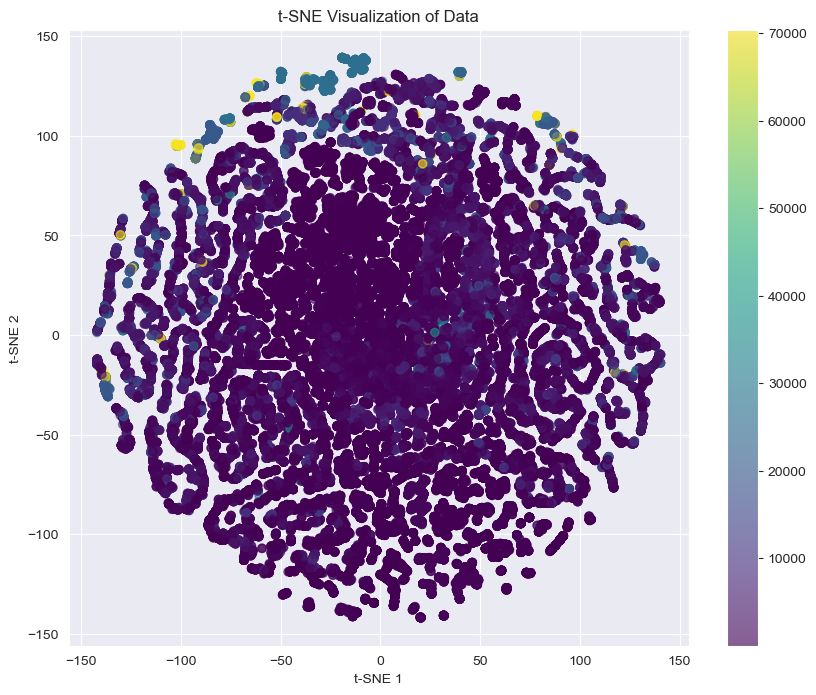

In [5]:
from sklearn.manifold import TSNE

def plot_tsne(X, y, perplexity=30, n_components=2):
    tsne = TSNE(n_components=n_components, perplexity=perplexity, random_state=42)
    X_tsne = tsne.fit_transform(X)

    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=y, cmap='viridis', alpha=0.6)
    plt.colorbar(scatter)
    plt.title('t-SNE Visualization of Data')
    plt.xlabel('t-SNE 1')
    plt.ylabel('t-SNE 2')
    plt.show()

plot_tsne(X_sample, y_sample)

C:\Users\Katarina\AppData\Local\Temp\ipykernel_22272\2677213610.py:9: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.annotate(feature, (correlations[i], importances[i]))


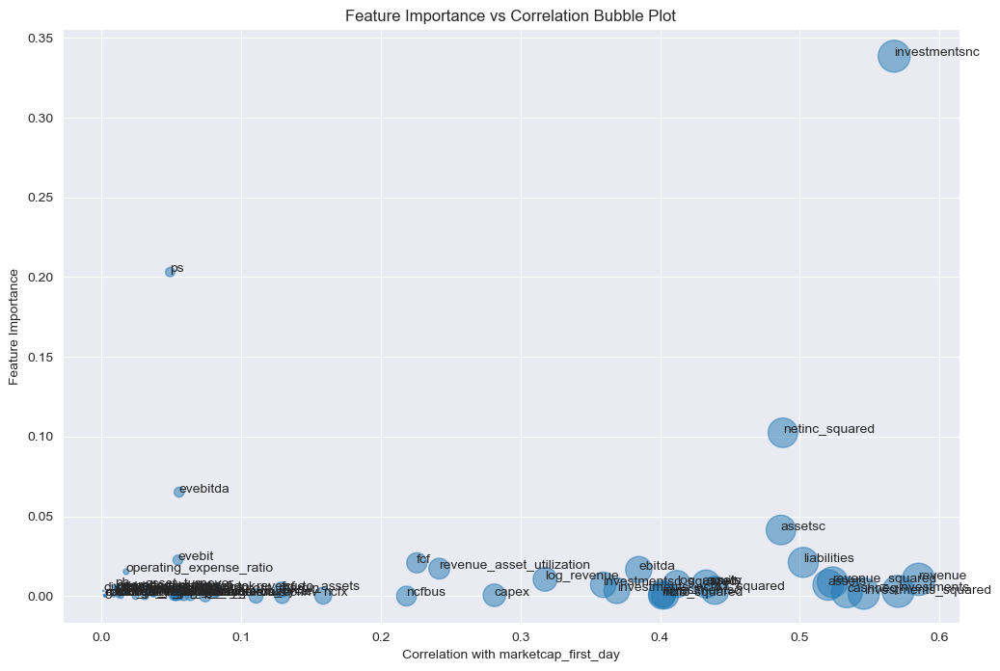

In [6]:
def plot_feature_importance_bubble(model, X, y):
    importances = model.feature_importances_
    correlations = X.corrwith(y).abs()

    plt.figure(figsize=(12, 8))
    plt.scatter(correlations, importances, alpha=0.5, s=correlations*1000)

    for i, feature in enumerate(X.columns):
        plt.annotate(feature, (correlations[i], importances[i]))

    plt.xlabel('Correlation with marketcap_first_day')
    plt.ylabel('Feature Importance')
    plt.title('Feature Importance vs Correlation Bubble Plot')
    plt.show()

plot_feature_importance_bubble(rf_model, X_train, y_train)

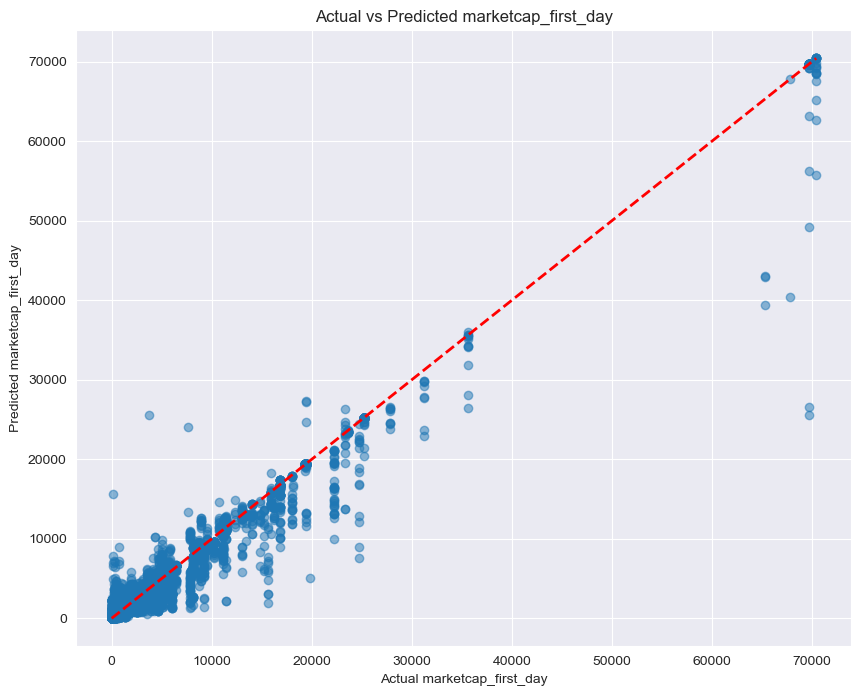

In [7]:
def plot_actual_vs_predicted(model, X, y):
    predictions = model.predict(X)

    plt.figure(figsize=(10, 8))
    plt.scatter(y, predictions, alpha=0.5)
    plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--', lw=2)
    plt.xlabel('Actual marketcap_first_day')
    plt.ylabel('Predicted marketcap_first_day')
    plt.title('Actual vs Predicted marketcap_first_day')
    plt.show()

plot_actual_vs_predicted(rf_model, X_test, y_test)

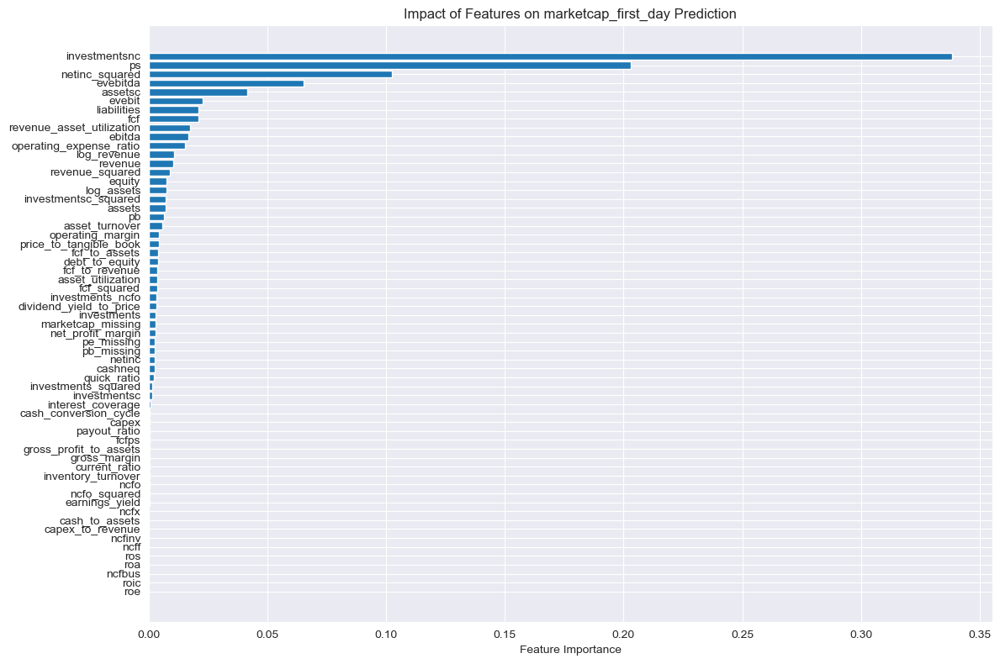

In [8]:
def plot_feature_impact(model, X):
    feature_importance = model.feature_importances_
    sorted_idx = np.argsort(feature_importance)
    pos = np.arange(sorted_idx.shape[0]) + .5

    fig, ax = plt.subplots(figsize=(12, 8))
    ax.barh(pos, feature_importance[sorted_idx], align='center')
    ax.set_yticks(pos)
    ax.set_yticklabels(X.columns[sorted_idx])
    ax.set_xlabel('Feature Importance')
    ax.set_title('Impact of Features on marketcap_first_day Prediction')
    plt.tight_layout()
    plt.show()

plot_feature_impact(rf_model, X_train)

C:\Users\Katarina\AppData\Local\Temp\ipykernel_22272\2023298430.py:14: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


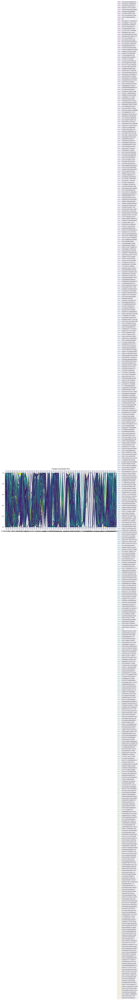

In [11]:
from pandas.plotting import parallel_coordinates

def plot_parallel_coordinates(X, y, sample_size=60000):
    sample = X.sample(sample_size, random_state=42)
    sample['marketcap_first_day'] = y.loc[sample.index]

    # Normalize the data
    normalized_df = (sample - sample.min()) / (sample.max() - sample.min())

    plt.figure(figsize=(15, 8))
    parallel_coordinates(normalized_df, 'marketcap_first_day', colormap=plt.get_cmap("viridis"))
    plt.title('Parallel Coordinates Plot')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

plot_parallel_coordinates(X_sample, y_sample)

C:\Users\Katarina\AppData\Local\Temp\ipykernel_22272\2915814056.py:11: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


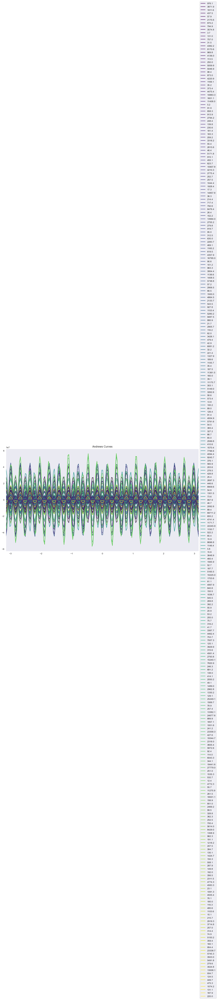

In [12]:
from pandas.plotting import andrews_curves

def plot_andrews_curves(X, y, sample_size=1000):
    sample = X.sample(sample_size, random_state=42)
    sample['marketcap_first_day'] = y.loc[sample.index]

    plt.figure(figsize=(15, 8))
    andrews_curves(sample, 'marketcap_first_day', colormap=plt.get_cmap("viridis"))
    plt.title('Andrews Curves')
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.tight_layout()
    plt.show()

plot_andrews_curves(X_sample, y_sample)

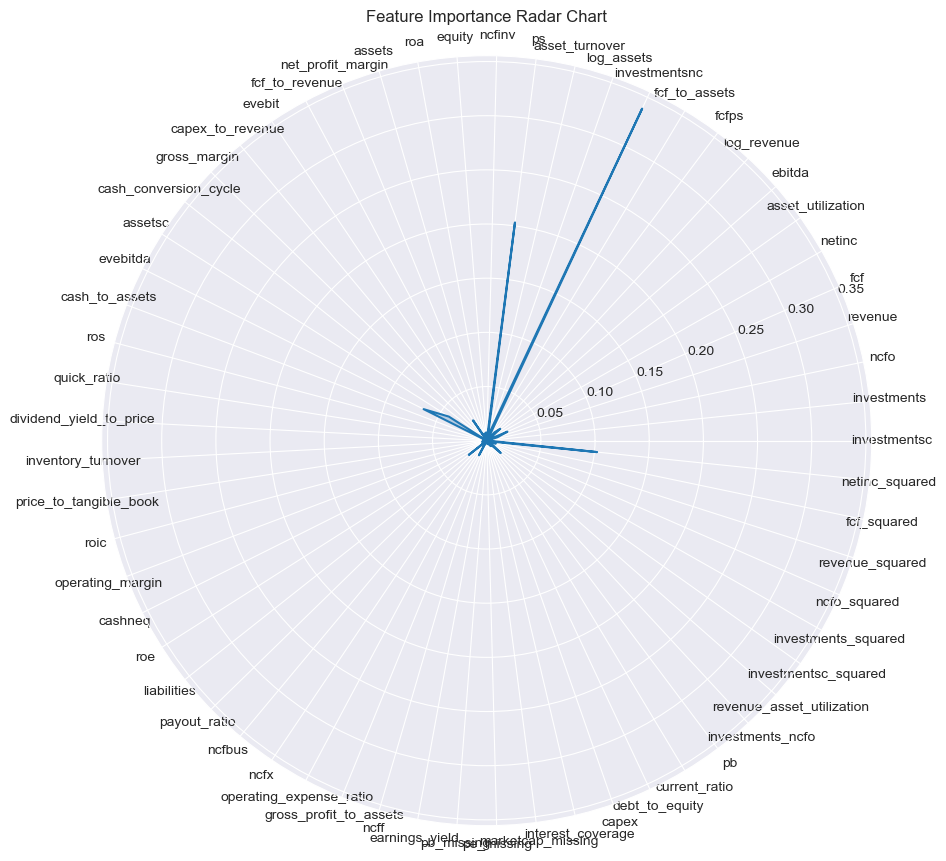

In [13]:
import matplotlib.pyplot as plt
import numpy as np

def plot_radar_chart(model, X):
    importances = model.feature_importances_
    features = X.columns

    angles = np.linspace(0, 2*np.pi, len(features), endpoint=False)
    importances = np.concatenate((importances, [importances[0]]))  # repeat the first value to close the polygon
    angles = np.concatenate((angles, [angles[0]]))  # repeat the first angle to close the polygon

    fig, ax = plt.subplots(figsize=(10, 10), subplot_kw=dict(projection='polar'))
    ax.plot(angles, importances)
    ax.fill(angles, importances, alpha=0.25)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(features)
    ax.set_title("Feature Importance Radar Chart")
    plt.show()

plot_radar_chart(rf_model, X_train)

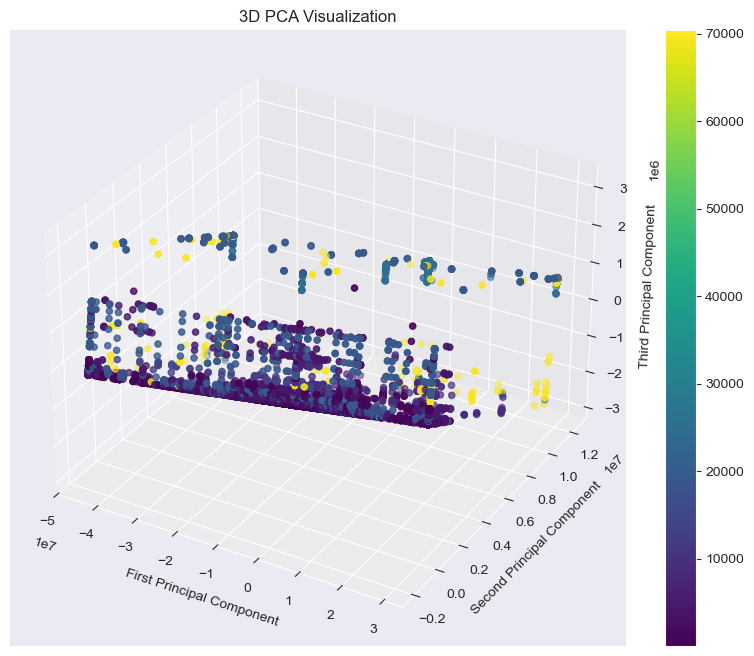

In [14]:
from sklearn.decomposition import PCA
from mpl_toolkits.mplot3d import Axes3D

def plot_3d_pca(X, y):
    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(X)

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    scatter = ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=y, cmap='viridis')
    ax.set_xlabel('First Principal Component')
    ax.set_ylabel('Second Principal Component')
    ax.set_zlabel('Third Principal Component')
    ax.set_title('3D PCA Visualization')
    plt.colorbar(scatter)
    plt.show()

plot_3d_pca(X_sample, y_sample)

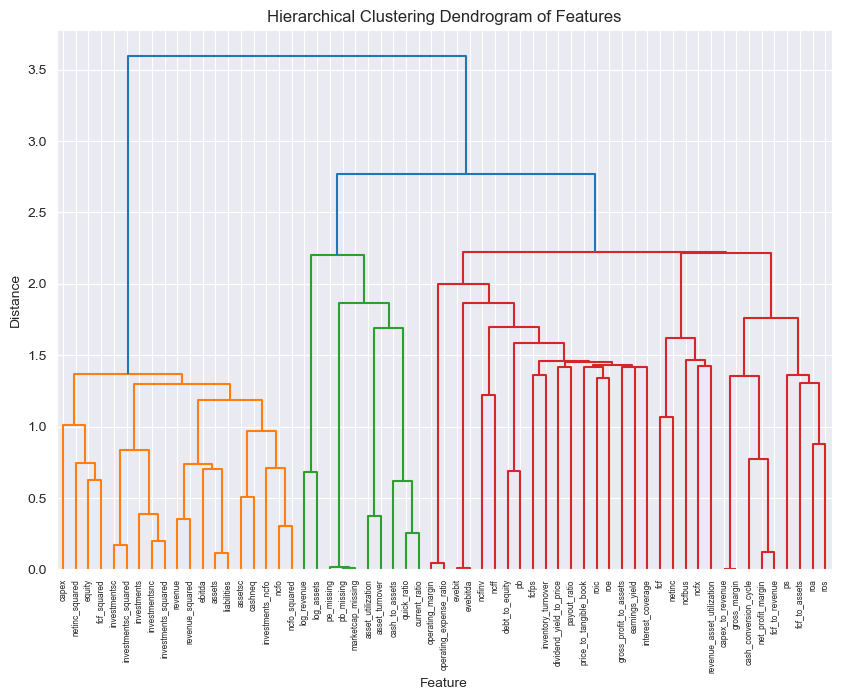

In [15]:
from scipy.cluster import hierarchy
from scipy.spatial.distance import pdist

def plot_feature_dendrogram(X):
    corr = X.corr()
    dissimilarity = 1 - abs(corr)
    Z = hierarchy.linkage(pdist(dissimilarity), 'complete')

    plt.figure(figsize=(10, 7))
    dn = hierarchy.dendrogram(Z, labels=corr.columns)
    plt.title('Hierarchical Clustering Dendrogram of Features')
    plt.xlabel('Feature')
    plt.ylabel('Distance')
    plt.show()

plot_feature_dendrogram(X_sample)

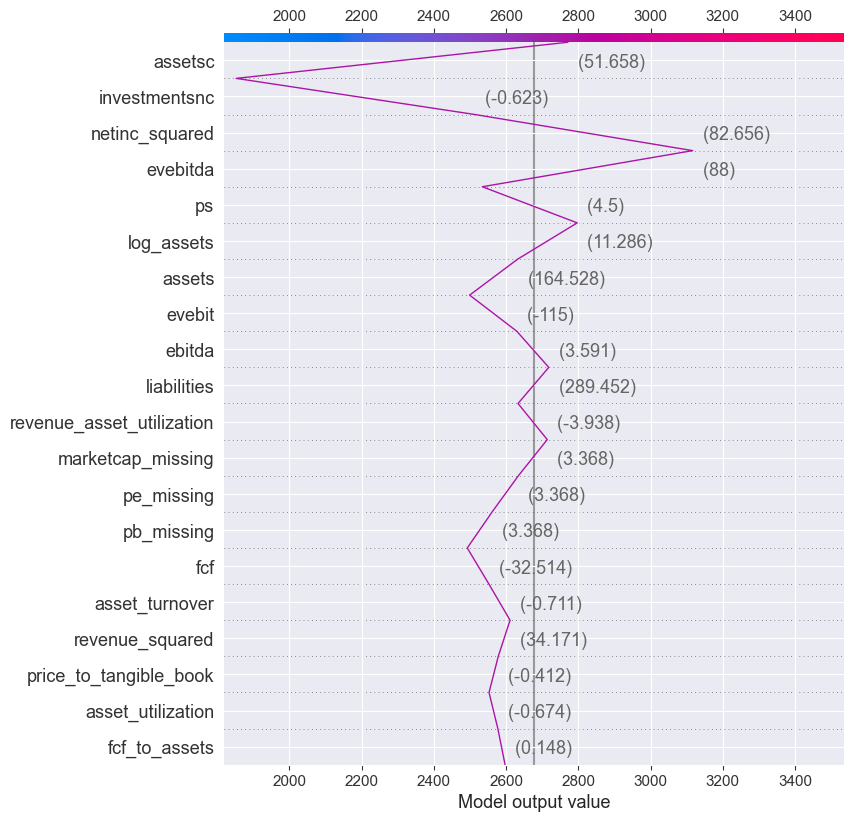

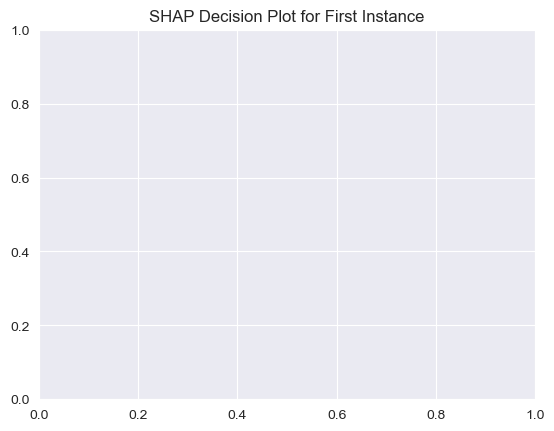

In [16]:
def plot_shap_decision(model, X):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    plt.figure(figsize=(12, 8))
    shap.decision_plot(explainer.expected_value, shap_values[0], X.iloc[0])
    plt.title('SHAP Decision Plot for First Instance')
    plt.show()

plot_shap_decision(rf_model, X_test)